In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import json
import seaborn as sns

%matplotlib inline

In [173]:
import geopandas as gpd
import contextily as ctx

In [3]:
from itertools import chain

In [19]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, roc_curve, auc, RocCurveDisplay

In [20]:
sns.set_theme()

In [21]:
from scipy.stats import spearmanr, pearsonr

In [22]:
pd.options.display.max_rows = 5000
pd.options.display.max_columns = 500

# Summary of the data

Data is from [Inside AirBNB](http://insideairbnb.com/get-the-data.html). There are five files provided (filenames changed to avoid redundancy). A data dictionary is [here](https://docs.google.com/spreadsheets/d/1iWCNJcSutYqpULSQHlNyGInUvHg2BoUGoNRIGa6Szc4/edit#gid=982310896).

TODO talk about them using reviews as occupancy proxy.


- listings_summary.csv (was listings.csv)
    - condensed listings file
- listings.csv (was listings.csv.gz)
    - full listings data
- reviews_summary.csv (was reviews.csv)
    - dates of when reviews were.
- reviews.csv (was reviews.csv.gz)
    - full reviews data
- calendar.csv
    - availability calendar
    
Inspecting the data dict and the files, I decided to use only the listings summary and pull selected features from the full listings csv, as the reviews and calendar are partially captured and summarized in the listings csv anyways.

In [23]:
listings_summary = pd.read_csv('data/listings_summary.csv')
listings = pd.read_csv('data/listings.csv')
reviews_summary = pd.read_csv('data/reviews_summary.csv')
reviews = pd.read_csv('data/reviews.csv')
calendar = pd.read_csv('data/calendar.csv')

In [24]:
listings_summary.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,10080,D1 - Million Dollar View 2 BR,30899,Rami,NaN,Downtown,49.28872,-123.12046,Entire home/apt,150,90,16,2017-02-26,0.14,40,346
1,13358,Monthly (or Longer ) Designer One Bedroom Down...,52116,Lynn,NaN,West End,49.28201,-123.12669,Entire home/apt,85,30,430,2021-01-01,3.27,1,98
2,13490,Vancouver's best kept secret,52467,Iris,NaN,Kensington-Cedar Cottage,49.25622,-123.06607,Entire home/apt,145,30,88,2020-10-31,0.73,1,203
3,14267,EcoLoft Vancouver,56030,Peter & Alison,NaN,Kensington-Cedar Cottage,49.24922,-123.08139,Entire home/apt,140,3,33,2020-02-07,0.26,1,123
4,16254,Close to PNE/Hastings Park and East Village,63238,Jason,NaN,Hastings-Sunrise,49.27721,-123.04086,Entire home/apt,195,3,5,2019-08-19,0.15,1,289


In [25]:
listings.head()

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,10080,https://www.airbnb.com/rooms/10080,20210412154228,2021-04-13,D1 - Million Dollar View 2 BR,"Stunning two bedroom, two bathroom apartment. ...",NaN,https://a0.muscache.com/pictures/55778229/c2f7...,30899,https://www.airbnb.com/users/show/30899,Rami,2009-08-10,"Vancouver, British Columbia, Canada",I will be happy to host you.,within an hour,93%,87%,f,https://a0.muscache.com/im/pictures/user/55302...,https://a0.muscache.com/im/pictures/user/55302...,Coal Harbour,49.0,49.0,"['email', 'phone', 'reviews', 'jumio', 'govern...",t,t,NaN,Downtown,NaN,49.28872,-123.12046,Entire condominium,Entire home/apt,5,NaN,2 baths,2.0,2.0,"[""Iron"", ""Dryer"", ""Bed linens"", ""Cooking basic...",$150.00,90,1124,90,90,1124,1124,90.0,1124.0,NaN,t,11,41,71,346,2021-04-13,16,0,0,2011-11-15,2017-02-26,93.0,9.0,9.0,10.0,9.0,10.0,9.0,18-476608,f,40,40,0,0,0.14
1,13358,https://www.airbnb.com/rooms/13358,20210412154228,2021-04-13,Monthly (or Longer ) Designer One Bedroom Down...,<b>The space</b><br />This suites central loca...,NaN,https://a0.muscache.com/pictures/c23bb7ef-e300...,52116,https://www.airbnb.com/users/show/52116,Lynn,2009-11-07,"Vancouver, British Columbia, Canada",I am from Vancouver and in my free time enjoy ...,within a day,100%,57%,t,https://a0.muscache.com/defaults/user_pic-50x5...,https://a0.muscache.com/defaults/user_pic-225x...,Downtown Vancouver,1.0,1.0,"['email', 'phone', 'facebook', 'reviews', 'jum...",f,t,NaN,West End,NaN,49.28201,-123.12669,Entire condominium,Entire home/apt,2,NaN,1 bath,1.0,1.0,"[""Iron"", ""Dryer"", ""Bed linens"", ""Cooking basic...",$85.00,30,60,30,30,60,60,30.0,60.0,NaN,t,0,7,7,98,2021-04-13,430,3,0,2010-06-22,2021-01-01,93.0,9.0,10.0,9.0,10.0,10.0,9.0,18-611603,f,1,1,0,0,3.27
2,13490,https://www.airbnb.com/rooms/13490,20210412154228,2021-04-13,Vancouver's best kept secret,This apartment rents for one month blocks of t...,"In the heart of Vancouver, this apartment has ...",https://a0.muscache.com/pictures/73394727/79d5...,52467,https://www.airbnb.com/users/show/52467,Iris,2009-11-08,"Vancouver, British Columbia, Canada",Hello! My husband Fred and I are actors living...,within an hour,100%,78%,t,https://a0.muscache.com/im/users/52467/profile...,https://a0.muscache.com/im/users/52467/profile...,Kensington-Cedar Cottage,4.0,4.0,"['email', 'phone', 'reviews', 'offline_governm...",t,t,"Vancouver, British Columbia, Canada",Kensington-Cedar Cottage,NaN,49.25622,-123.06607,Entire apartment,Entire home/apt,2,NaN,1 bath,1.0,1.0,"[""Iron"", ""Outdoor dining area"", ""Ethernet conn...",$145.00,30,90,30,30,90,90,30.0,90.0,NaN,t,0,9,9,203,2021-04-13,88,4,0,2011-06-02,2020-10-31,98.0,10.0,10.0,10.0,10.0,10.0,10.0,NaN,f,1,1,

In [26]:
reviews_summary.head()

,listing_id,date
0,10080,2011-11-15
1,10080,2011-12-14
2,10080,2012-03-12
3,10080,2012-06-05
4,10080,2013-01-15


In [27]:
reviews.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,10080,720466,2011-11-15,143771,Anthony,this accommodation was excellent. beautiful sp...
1,10080,786114,2011-12-14,1472653,Nilesh,The host canceled my reservation 13 days befor...
2,10080,989885,2012-03-12,1433564,Avril,"This apartment is fantastic, just what I and m..."
3,10080,1419559,2012-06-05,725806,Dennis,Very nice apartment and great view. Close to S...
4,10080,3354964,2013-01-15,3641867,Jude,Both Rami and Mauricio made our family of 5 fe...


In [28]:
calendar.head()

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,35304,2021-04-14,f,$75.00,$75.00,2.0,30.0
1,35304,2021-04-15,t,$75.00,$75.00,2.0,30.0
2,35304,2021-04-16,t,$75.00,$75.00,2.0,30.0
3,35304,2021-04-17,t,$75.00,$75.00,2.0,30.0
4,35304,2021-04-18,t,$75.00,$75.00,2.0,30.0


# Wrangling

## Listings Summary
This is what `listings_summary` looks like:

In [29]:
listings_summary.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,10080,D1 - Million Dollar View 2 BR,30899,Rami,NaN,Downtown,49.28872,-123.12046,Entire home/apt,150,90,16,2017-02-26,0.14,40,346
1,13358,Monthly (or Longer ) Designer One Bedroom Down...,52116,Lynn,NaN,West End,49.28201,-123.12669,Entire home/apt,85,30,430,2021-01-01,3.27,1,98
2,13490,Vancouver's best kept secret,52467,Iris,NaN,Kensington-Cedar Cottage,49.25622,-123.06607,Entire home/apt,145,30,88,2020-10-31,0.73,1,203
3,14267,EcoLoft Vancouver,56030,Peter & Alison,NaN,Kensington-Cedar Cottage,49.24922,-123.08139,Entire home/apt,140,3,33,2020-02-07,0.26,1,123
4,16254,Close to PNE/Hastings Park and East Village,63238,Jason,NaN,Hastings-Sunrise,49.27721,-123.04086,Entire home/apt,195,3,5,2019-08-19,0.15,1,289


In [30]:
listings_summary.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4299 entries, 0 to 4298
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              4299 non-null   int64  
 1   name                            4299 non-null   object 
 2   host_id                         4299 non-null   int64  
 3   host_name                       4170 non-null   object 
 4   neighbourhood_group             0 non-null      float64
 5   neighbourhood                   4299 non-null   object 
 6   latitude                        4299 non-null   float64
 7   longitude                       4299 non-null   float64
 8   room_type                       4299 non-null   object 
 9   price                           4299 non-null   int64  
 10  minimum_nights                  4299 non-null   int64  
 11  number_of_reviews               4299 non-null   int64  
 12  last_review                     34

`neighbourhood_group` is all NaN, so will be dropped.

I'm going to drop the `name` of the listing as well. Although there might be some correlation between the marketing value in a title, I don't plan on doing any text analysis.

`host_name` also will be dropped, as `host_id` will suffice for tracking hosts.



In [31]:
listings_summary = listings_summary.drop(labels=['neighbourhood_group', 'name', 'host_name'], axis=1)

## Listings

I'm going to grab only useful looking features of out this data.

In [32]:
listings.head(1)

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,10080,https://www.airbnb.com/rooms/10080,20210412154228,2021-04-13,D1 - Million Dollar View 2 BR,"Stunning two bedroom, two bathroom apartment. ...",NaN,https://a0.muscache.com/pictures/55778229/c2f7...,30899,https://www.airbnb.com/users/show/30899,Rami,2009-08-10,"Vancouver, British Columbia, Canada",I will be happy to host you.,within an hour,93%,87%,f,https://a0.muscache.com/im/pictures/user/55302...,https://a0.muscache.com/im/pictures/user/55302...,Coal Harbour,49.0,49.0,"['email', 'phone', 'reviews', 'jumio', 'govern...",t,t,NaN,Downtown,NaN,49.28872,-123.12046,Entire condominium,Entire home/apt,5,NaN,2 baths,2.0,2.0,"[""Iron"", ""Dryer"", ""Bed linens"", ""Cooking basic...",$150.00,90,1124,90,90,1124,1124,90.0,1124.0,NaN,t,11,41,71,346,2021-04-13,16,0,0,2011-11-15,2017-02-26,93.0,9.0,9.0,10.0,9.0,10.0,9.0,18-476608,f,40,40,0,0,0.14


In [33]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4299 entries, 0 to 4298
Data columns (total 74 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            4299 non-null   int64  
 1   listing_url                                   4299 non-null   object 
 2   scrape_id                                     4299 non-null   int64  
 3   last_scraped                                  4299 non-null   object 
 4   name                                          4299 non-null   object 
 5   description                                   4272 non-null   object 
 6   neighborhood_overview                         3074 non-null   object 
 7   picture_url                                   4299 non-null   object 
 8   host_id                                       4299 non-null   int64  
 9   host_url                                      4299 non-null   o

After a cursory inspection, a number of features related to the host, the properties of the room, and the reviews seem interesting.

In [34]:
interesting_props_dict = {'host': ['host_since', 'host_response_time', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost',
              'host_has_profile_pic', 'host_identity_verified'],
                          
                          'room': ['property_type', 'room_type', 'accommodates', 'bathrooms', 'bathrooms_text', 'bedrooms', 'beds',
               'amenities', 'instant_bookable'],
                          
                          'review': ['number_of_reviews', 'number_of_reviews_ltm', 'number_of_reviews_l30d', 'first_review',
               'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin',
               'review_scores_communication', 'review_scores_location', 'review_scores_value']
                         }
                          

# DATA CLEANING
I'll now look through the datasets we have and clean them as necessary, i.e. checking for duplicates, dealing with NaN's, and adjusting datatypes.

For clarity, I'll break the cleaning into four parts for each of `listings_summary`, `listings_host`, `listings_room`, `listings_review`, before combining them back together again.

In [35]:
## .copy() prevents SettingWithCopy warnings later on in the pipeline
# Features related to the host from listings.csv
listings_host = listings[interesting_props_dict['host']].copy()
# Features related to the room from listings.csv
listings_room = listings[interesting_props_dict['room']].copy()
# Features related to reviews from listings.csv
listings_review = listings[interesting_props_dict['review']].copy()

## Helper functions for data cleaning
First, define a some helper functions for converting data types:

In [36]:
def convert_percent_to_float(string_percent):
    """
    Converts percentage strings to a float ratio e.g. 95% -> 0.95.
    
    For applying to dataframe elements. If element is NaN, returns back the element.
    """
    if pd.isna(string_percent):
        return string_percent
    else:
        return float(string_percent.strip('%'))/100

In [37]:
def convert_tf_to_float(string):
    """
    Converts strings of "t" and "f" to 1.0 or 0.0 floats.
    
    For applying to dataframe elements. If element is NaN, returns back the element.
    """ 
    if pd.isna(string):
        return string
    else:    
        return {'t':1, 'f':0}[string]

In [38]:
def convert_str_to_datetime(string, format='%Y-%m-%d'):
    """
    Converts strings of YYYY-MM-DD format (by default) to datetime objects.
    
    For applying to dataframe elements. If element is NaN, returns back the element.
    
    Uses pd.to_datetime.
    """ 
    return pd.to_datetime(string, format=format)
    

In [39]:
def col_apply_inplace(df, cols, f, **kwds):
    """
    Helper func to apply a func to elements of a column in-place.
    
    df   : input dataframe
    cols : single string or list of strings of column names
    f    : the function to apply to the elements of the columns
    kwds : keyword arguments to pass onto f
    """
    if type(cols) == str:
        df.loc[:,cols] = df.loc[:,cols].apply(f, **kwds)
    elif type(cols) == list:
        for col in cols:
            df.loc[:,col] = df.loc[:,col].apply(f, **kwds)
    else:
        raise ValueError('cols is not a single column name string or a list of column name strings')

For `listings_summary`, `last_review` needs to be converted to datetimes.

In [40]:
listings_summary.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4299 entries, 0 to 4298
Data columns (total 13 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              4299 non-null   int64  
 1   host_id                         4299 non-null   int64  
 2   neighbourhood                   4299 non-null   object 
 3   latitude                        4299 non-null   float64
 4   longitude                       4299 non-null   float64
 5   room_type                       4299 non-null   object 
 6   price                           4299 non-null   int64  
 7   minimum_nights                  4299 non-null   int64  
 8   number_of_reviews               4299 non-null   int64  
 9   last_review                     3499 non-null   object 
 10  reviews_per_month               3499 non-null   float64
 11  calculated_host_listings_count  4299 non-null   int64  
 12  availability_365                42

In [41]:
# Convert to datetime
col_apply_inplace(listings_summary, 'last_review', convert_str_to_datetime)

## `listings_host`

`listings_host` is an all string dataframe 

In [42]:
listings_host.head()

,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified
0,2009-08-10,within an hour,93%,87%,f,t,t
1,2009-11-07,within a day,100%,57%,t,f,t
2,2009-11-08,within an hour,100%,78%,t,t,t
3,2009-11-20,within a few hours,100%,NaN,f,t,t
4,2009-12-15,NaN,NaN,NaN,f,t,t


In [43]:
listings_host.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4299 entries, 0 to 4298
Data columns (total 7 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   host_since              4170 non-null   object
 1   host_response_time      2991 non-null   object
 2   host_response_rate      2991 non-null   object
 3   host_acceptance_rate    3099 non-null   object
 4   host_is_superhost       4170 non-null   object
 5   host_has_profile_pic    4170 non-null   object
 6   host_identity_verified  4170 non-null   object
dtypes: object(7)
memory usage: 235.2+ KB


I'll need to convert t/f columns to 1.0 and 0.0 representing true and false, convert dates to datetimes, and percentages to ratios.

In [44]:
col_apply_inplace(listings_host, 'host_since', convert_str_to_datetime)

col_apply_inplace(listings_host, 
                  ['host_response_rate', 'host_acceptance_rate'], 
                  convert_percent_to_float)

col_apply_inplace(listings_host, 
                  ['host_is_superhost','host_has_profile_pic','host_identity_verified'], 
                  convert_tf_to_float)

In [45]:
listings_host.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4299 entries, 0 to 4298
Data columns (total 7 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   host_since              4170 non-null   datetime64[ns]
 1   host_response_time      2991 non-null   object        
 2   host_response_rate      2991 non-null   float64       
 3   host_acceptance_rate    3099 non-null   float64       
 4   host_is_superhost       4170 non-null   float64       
 5   host_has_profile_pic    4170 non-null   float64       
 6   host_identity_verified  4170 non-null   float64       
dtypes: datetime64[ns](1), float64(5), object(1)
memory usage: 235.2+ KB


In [46]:
listings_host.head()

,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified
0,2009-08-10,within an hour,0.93,0.87,0.0,1.0,1.0
1,2009-11-07,within a day,1.00,0.57,1.0,0.0,1.0
2,2009-11-08,within an hour,1.00,0.78,1.0,1.0,1.0
3,2009-11-20,within a few hours,1.00,NaN,0.0,1.0,1.0
4,2009-12-15,NaN,NaN,NaN,0.0,1.0,1.0


# ROOM CLEAN

`listings_room` has two columns of note. `bathrooms_text` are host-entered strings describing their bathroom situation, whereas `amenities` is are json formatted collections of various amenities the property has.

In [47]:
listings_room.head()

,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,instant_bookable
0,Entire condominium,Entire home/apt,5,NaN,2 baths,2.0,2.0,"[""Iron"", ""Dryer"", ""Bed linens"", ""Cooking basic...",f
1,Entire condominium,Entire home/apt,2,NaN,1 bath,1.0,1.0,"[""Iron"", ""Dryer"", ""Bed linens"", ""Cooking basic...",f
2,Entire apartment,Entire home/apt,2,NaN,1 bath,1.0,1.0,"[""Iron"", ""Outdoor dining area"", ""Ethernet conn...",f
3,Entire house,Entire home/apt,4,NaN,1 bath,1.0,2.0,"[""Iron"", ""Dryer"", ""Cooking basics"", ""Hot water...",t
4,Entire guest suite,Entire home/apt,4,NaN,1 bath,2.0,3.0,"[""Iron"", ""Dryer"", ""Bed linens"", ""Cooking basic...",t


In [48]:
listings_room.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4299 entries, 0 to 4298
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   property_type     4299 non-null   object 
 1   room_type         4299 non-null   object 
 2   accommodates      4299 non-null   int64  
 3   bathrooms         0 non-null      float64
 4   bathrooms_text    4297 non-null   object 
 5   bedrooms          3987 non-null   float64
 6   beds              4263 non-null   float64
 7   amenities         4299 non-null   object 
 8   instant_bookable  4299 non-null   object 
dtypes: float64(3), int64(1), object(5)
memory usage: 302.4+ KB


Inspecting the amenities, each property has a combination of many amenities. These aren't very standardized.

In [49]:
amen = listings_room['amenities'].copy()

In [50]:
amen.value_counts()

["Heating", "Kitchen", "Stove", "Microwave", "Dryer", "Washer", "Wifi", "Long term stays allowed", "TV", "Hot water", "Smoke alarm", "Oven"]                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

Pulling out the individual amenities, it's a long-tailed distribution (i.e. most amenity types are present in low-count, but there are a lot of them).

In [51]:
amenity_series = pd.Series([item for sublist in amen for item in json.loads(sublist)]).value_counts()

In [52]:
amenity_series

Wifi                                                                                                                                                                4226
Heating                                                                                                                                                             4138
Smoke alarm                                                                                                                                                         4112
Essentials                                                                                                                                                          4001
Kitchen                                                                                                                                                             3986
Long term stays allowed                                                                                                                                    

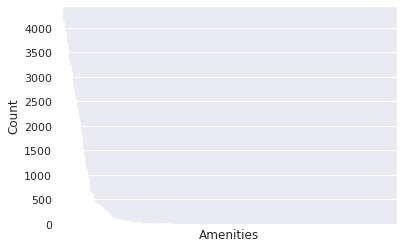

In [53]:
axes =  amenity_series.plot.bar()
# Turn off x-axis, otherwise x tick labels are a mess
axes.set_xticks([])
axes.set_xlabel('Amenities')
axes.set_ylabel('Count');


One way would be to pull out only the most popular amenities.

In [54]:
amenity_series.describe()

count     495.000000
mean      243.573737
std       760.174209
min         1.000000
25%         1.000000
50%         1.000000
75%        18.500000
max      4226.000000
dtype: float64

In [55]:
amenity_series.index[amenity_series >= 20].size

123

In [56]:
amenity_series.index[amenity_series >= 1000].size

38

An arbitrary threshold of having at least a count of 1000 might be reasonable

In [57]:
amenities_to_keep = amenity_series.index[amenity_series >= 1000]
# Make an zeros df
amenities_df = pd.DataFrame(np.zeros([listings_room.shape[0], amenities_to_keep.size]), columns=amenities_to_keep)

# Fill in the df by for loop, 1/0, basically dummy columns.
# Seems pretty slow.
for i, item in enumerate(listings_room['amenities']):
    amenities = json.loads(item)
    for amenity in amenities:
        amenities_df.iloc[i,:].loc[amenity] = 1

In [58]:
# Checking to see if correctly populated, by comparing to next cell
amenities_df.head()

,Wifi,Heating,Smoke alarm,Essentials,Kitchen,Long term stays allowed,Hangers,Washer,Dryer,Hair dryer,Hot water,Iron,Shampoo,Dedicated workspace,TV,Carbon monoxide alarm,Dishes and silverware,Fire extinguisher,Refrigerator,Cooking basics,Microwave,Coffee maker,Stove,Oven,Free parking on premises,Private entrance,Bed linens,Free street parking,Dishwasher,First aid kit,Patio or balcony,Extra pillows and blankets,Elevator,Cable TV,Luggage dropoff allowed,Air conditioning,Backyard,Gym
0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0
1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0
2,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0


In [59]:
listings_room.iloc[0,:]['amenities']

'["Iron", "Dryer", "Bed linens", "Cooking basics", "Elevator", "Hot water", "Indoor fireplace", "Dishes and silverware", "Stove", "Microwave", "Long term stays allowed", "TV with standard cable", "Refrigerator", "Hangers", "Pool", "Air conditioning", "Hair dryer", "Cable TV", "Gym", "Washer", "Wifi", "Carbon monoxide alarm", "Dedicated workspace", "Free parking on premises", "Smoke alarm", "Heating", "Kitchen", "Coffee maker", "Dishwasher", "Host greets you"]'

I'll prefix the columns in `amenities_df`, then drop the `amenities` column in `listings_room`, before glueing `amenities_df` back on:

In [60]:
amenities_df.columns = amenities_df.columns.str.lower()

In [61]:
amenities_df.columns = 'amenity_' + amenities_df.columns

In [62]:
listings_room = listings_room.drop(labels=['amenities'], axis=1)

In [63]:
listings_room = pd.concat([listings_room, amenities_df], axis=1)

In [64]:
listings_room.head()

,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,instant_bookable,amenity_wifi,amenity_heating,amenity_smoke alarm,amenity_essentials,amenity_kitchen,amenity_long term stays allowed,amenity_hangers,amenity_washer,amenity_dryer,amenity_hair dryer,amenity_hot water,amenity_iron,amenity_shampoo,amenity_dedicated workspace,amenity_tv,amenity_carbon monoxide alarm,amenity_dishes and silverware,amenity_fire extinguisher,amenity_refrigerator,amenity_cooking basics,amenity_microwave,amenity_coffee maker,amenity_stove,amenity_oven,amenity_free parking on premises,amenity_private entrance,amenity_bed linens,amenity_free street parking,amenity_dishwasher,amenity_first aid kit,amenity_patio or balcony,amenity_extra pillows and blankets,amenity_elevator,amenity_cable tv,amenity_luggage dropoff allowed,amenity_air conditioning,amenity_backyard,amenity_gym
0,Entire condominium,Entire home/apt,5,NaN,2 baths,2.0,2.0,f,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0
1,Entire condominium,Entire home/apt,2,NaN,1 bath,1.0,1.0,f,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0
2,Entire apartment,Entire home/apt,2,NaN,1 bath,1.0,1.0,f,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0
3,Entire house,Entire home/apt,4,NaN,1 bath,1.0,2.0,t,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Entire guest suite,Entire home/apt,4,NaN,1 bath,2.0,3.0,t,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0


Next, I'll extract numeric values from the bathroom text.

In [65]:
listings_room['bathrooms_text'].value_counts()

1 bath               2442
2 baths               610
1 shared bath         409
1 private bath        290
1.5 baths             185
2.5 baths             102
2 shared baths         62
3 baths                51
1.5 shared baths       44
3.5 baths              29
4 baths                17
3 shared baths          9
0 shared baths          9
0 baths                 8
6 baths                 5
4 shared baths          5
Shared half-bath        4
5 baths                 4
4.5 baths               3
7 baths                 2
Private half-bath       2
5.5 baths               2
6.5 baths               1
Half-bath               1
3.5 shared baths        1
Name: bathrooms_text, dtype: int64

All the values have a numeric value in the front, unless they are half-baths. I'll code half-baths as 0.5 bathrooms. I'll ignore the "shared" or "private" status, as it does not seem to be totally correlated with the type of property. 

In [66]:
def convert_bathrooms(txt):
    """
    Convert bathroom description string to a float.
    
    If the txt begins with a number, grabs the number by splitting on whitespace and returns it.
    
    Otherwise, it's a half bath, so return 0.5.
    
    Returns NaN if NaN encountered.
    """
    if pd.isna(txt):
        return np.nan
    elif txt[0].isnumeric():
        return float(txt.split(" ")[0])
    else:
        return 0.5  

In [67]:
# Testing the bathroom text conversion
listings_room['bathrooms_text'].apply(convert_bathrooms).value_counts()

1.0    3141
2.0     672
1.5     229
2.5     102
3.0      60
3.5      30
4.0      22
0.0      17
0.5       7
6.0       5
5.0       4
4.5       3
5.5       2
7.0       2
6.5       1
Name: bathrooms_text, dtype: int64

In [68]:
col_apply_inplace(listings_room, ['bathrooms_text'], convert_bathrooms)

`bathrooms` is all NaN, so I'll just drop it

In [69]:
listings_room['bathrooms'].isna().mean()

1.0

In [70]:
listings_room.drop(labels=['bathrooms'], axis=1, inplace=True)

In [71]:
listings_room.head()

,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,instant_bookable,amenity_wifi,amenity_heating,amenity_smoke alarm,amenity_essentials,amenity_kitchen,amenity_long term stays allowed,amenity_hangers,amenity_washer,amenity_dryer,amenity_hair dryer,amenity_hot water,amenity_iron,amenity_shampoo,amenity_dedicated workspace,amenity_tv,amenity_carbon monoxide alarm,amenity_dishes and silverware,amenity_fire extinguisher,amenity_refrigerator,amenity_cooking basics,amenity_microwave,amenity_coffee maker,amenity_stove,amenity_oven,amenity_free parking on premises,amenity_private entrance,amenity_bed linens,amenity_free street parking,amenity_dishwasher,amenity_first aid kit,amenity_patio or balcony,amenity_extra pillows and blankets,amenity_elevator,amenity_cable tv,amenity_luggage dropoff allowed,amenity_air conditioning,amenity_backyard,amenity_gym
0,Entire condominium,Entire home/apt,5,2.0,2.0,2.0,f,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0
1,Entire condominium,Entire home/apt,2,1.0,1.0,1.0,f,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0
2,Entire apartment,Entire home/apt,2,1.0,1.0,1.0,f,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0
3,Entire house,Entire home/apt,4,1.0,1.0,2.0,t,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Entire guest suite,Entire home/apt,4,1.0,2.0,3.0,t,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0


`property_type` and `room_type` seem to encode similar information, except `property_type` is much more diverse.

In [72]:
listings_room['property_type'].value_counts()

Entire apartment                      1012
Entire condominium                     816
Entire house                           642
Private room in house                  561
Entire guest suite                     513
Private room in apartment              155
Entire loft                            112
Entire townhouse                        91
Entire serviced apartment               69
Private room in condominium             63
Entire guesthouse                       50
Private room in townhouse               34
Private room in villa                   26
Private room in guest suite             21
Room in boutique hotel                  19
Entire bungalow                         14
Private room in bed and breakfast       10
Shared room in house                     9
Entire place                             8
Room in aparthotel                       7
Private room in guesthouse               7
Shared room in apartment                 7
Room in hotel                            6
Private roo

In [73]:
listings_room['room_type'].value_counts()

Entire home/apt    3359
Private room        915
Shared room          21
Hotel room            4
Name: room_type, dtype: int64

Rather than deal with `property_type`, I'll just drop it

In [74]:
listings_room = listings_room.drop(labels=['property_type'], axis=1)

`instant_bookable` is t/f representing true/false, so I'll convert that to 1/0's

In [75]:
col_apply_inplace(listings_room, 
                  ['instant_bookable'], 
                  convert_tf_to_float)

# Listings Review

In [76]:
listings_review.head()

,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
0,16,0,0,2011-11-15,93.0,9.0,9.0,10.0,9.0,10.0,9.0
1,430,3,0,2010-06-22,93.0,9.0,10.0,9.0,10.0,10.0,9.0
2,88,4,0,2011-06-02,98.0,10.0,10.0,10.0,10.0,10.0,10.0
3,33,0,0,2010-10-03,95.0,10.0,9.0,10.0,9.0,10.0,9.0
4,5,0,0,2018-08-04,96.0,10.0,10.0,10.0,10.0,10.0,9.0


In [77]:
listings_review.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4299 entries, 0 to 4298
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   number_of_reviews            4299 non-null   int64  
 1   number_of_reviews_ltm        4299 non-null   int64  
 2   number_of_reviews_l30d       4299 non-null   int64  
 3   first_review                 3499 non-null   object 
 4   review_scores_rating         3474 non-null   float64
 5   review_scores_accuracy       3462 non-null   float64
 6   review_scores_cleanliness    3462 non-null   float64
 7   review_scores_checkin        3461 non-null   float64
 8   review_scores_communication  3463 non-null   float64
 9   review_scores_location       3462 non-null   float64
 10  review_scores_value          3462 non-null   float64
dtypes: float64(7), int64(3), object(1)
memory usage: 369.6+ KB


The only thing I'll change here is converting dates to datetime format

In [78]:
col_apply_inplace(listings_review, ['first_review'], convert_str_to_datetime)

In [79]:
listings_review.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4299 entries, 0 to 4298
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   number_of_reviews            4299 non-null   int64         
 1   number_of_reviews_ltm        4299 non-null   int64         
 2   number_of_reviews_l30d       4299 non-null   int64         
 3   first_review                 3499 non-null   datetime64[ns]
 4   review_scores_rating         3474 non-null   float64       
 5   review_scores_accuracy       3462 non-null   float64       
 6   review_scores_cleanliness    3462 non-null   float64       
 7   review_scores_checkin        3461 non-null   float64       
 8   review_scores_communication  3463 non-null   float64       
 9   review_scores_location       3462 non-null   float64       
 10  review_scores_value          3462 non-null   float64       
dtypes: datetime64[ns](1), float64(7), int64(3)


## PUTTING IT BACK TOGETHER

In [80]:
df = pd.concat([listings_summary, listings_host, listings_room, listings_review], axis=1)

In [81]:
df.head()

,id,host_id,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,room_type,accommodates,bathrooms_text,bedrooms,beds,instant_bookable,amenity_wifi,amenity_heating,amenity_smoke alarm,amenity_essentials,amenity_kitchen,amenity_long term stays allowed,amenity_hangers,amenity_washer,amenity_dryer,amenity_hair dryer,amenity_hot water,amenity_iron,amenity_shampoo,amenity_dedicated workspace,amenity_tv,amenity_carbon monoxide alarm,amenity_dishes and silverware,amenity_fire extinguisher,amenity_refrigerator,amenity_cooking basics,amenity_microwave,amenity_coffee maker,amenity_stove,amenity_oven,amenity_free parking on premises,amenity_private entrance,amenity_bed linens,amenity_free street parking,amenity_dishwasher,amenity_first aid kit,amenity_patio or balcony,amenity_extra pillows and blankets,amenity_elevator,amenity_cable tv,amenity_luggage dropoff allowed,amenity_air conditioning,amenity_backyard,amenity_gym,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
0,10080,30899,Downtown,49.28872,-123.12046,Entire home/apt,150,90,16,2017-02-26,0.14,40,346,2009-08-10,within an hour,0.93,0.87,0.0,1.0,1.0,Entire home/apt,5,2.0,2.0,2.0,0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,16,0,0,2011-11-15,93.0,9.0,9.0,10.0,9.0,10.0,9.0
1,13358,52116,West End,49.28201,-123.12669,Entire home/apt,85,30,430,2021-01-01,3.27,1,98,2009-11-07,within a day,1.00,0.57,1.0,0.0,1.0,Entire home/apt,2,1.0,1.0,1.0,0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,430,3,0,2010-06-22,93.0,9.0,10.0,9.0,10.0,10.0,9.0
2,13490,52467,Kensington-Cedar Cottage,49.25622,-123.06607,Entire home/apt,145,30,88,2020-10-31,0.73,1,203,2009-11-08,within an hour,1.00,0.78,1.0,1.0,1.0,Entire home/apt,2,1.0,1.0,1.0,0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,88,4,0,2011-06-02,98.0,10.0,10.0,10.0,10.0,10.0,10.0
3,14267,56030,Kensington-Cedar Cottage,49.24922,-123.08139,Entire home/apt,140,3,33,2020-02-07,0.26,1,123,2009-11-20,within a few hours,1.00,NaN,0.0,1.0,1.0,Entire home/apt,4,1.0,1.0,2.0,1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,33,0,0,2010-10-03,95.0,10.0,9.0,10.0,9.0,10.0,9.0
4,16254,63238,Hastings-Sunrise,49.27721,-123.04086,Entire home/apt,195,3,5,2019-08-19,0.15,1,289,2009-12-15,NaN,NaN,NaN,0.0,1.0,1.0,Entire home/apt,4,1.0,2.0,3.0,1,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,5,0,0,2018-08-04,96.0,10.0,10.0,10.0,10.0,10.0,9.0


In [82]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4299 entries, 0 to 4298
Data columns (total 75 columns):
 #   Column                              Non-Null Count  Dtype         
---  ------                              --------------  -----         
 0   id                                  4299 non-null   int64         
 1   host_id                             4299 non-null   int64         
 2   neighbourhood                       4299 non-null   object        
 3   latitude                            4299 non-null   float64       
 4   longitude                           4299 non-null   float64       
 5   room_type                           4299 non-null   object        
 6   price                               4299 non-null   int64         
 7   minimum_nights                      4299 non-null   int64         
 8   number_of_reviews                   4299 non-null   int64         
 9   last_review                         3499 non-null   datetime64[ns]
 10  reviews_per_month       

Check for duplicated rows:

In [83]:
df.duplicated().sum()

0

There are two duplicated columns:

In [84]:
df.columns[df.columns.duplicated()]

Index(['room_type', 'number_of_reviews'], dtype='object')

Drop the duplicated columns:

In [85]:
df = df.loc[:, ~df.columns.duplicated()]

Rearrange the columns to put some properties from `listings_summary` next to other grouped properties

In [86]:
df.columns

Index(['id', 'host_id', 'neighbourhood', 'latitude', 'longitude', 'room_type',
       'price', 'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'host_since', 'host_response_time',
       'host_response_rate', 'host_acceptance_rate', 'host_is_superhost',
       'host_has_profile_pic', 'host_identity_verified', 'accommodates',
       'bathrooms_text', 'bedrooms', 'beds', 'instant_bookable',
       'amenity_wifi', 'amenity_heating', 'amenity_smoke alarm',
       'amenity_essentials', 'amenity_kitchen',
       'amenity_long term stays allowed', 'amenity_hangers', 'amenity_washer',
       'amenity_dryer', 'amenity_hair dryer', 'amenity_hot water',
       'amenity_iron', 'amenity_shampoo', 'amenity_dedicated workspace',
       'amenity_tv', 'amenity_carbon monoxide alarm',
       'amenity_dishes and silverware', 'amenity_fire extinguisher',
       'amenity_refrigerator', 'amenity_cooking basics', 'a

In [87]:
df = df[['id',  'neighbourhood', 'latitude', 'longitude',
       'price', 'minimum_nights',
       'availability_365', 
       # Host properties
       'host_id',
       'calculated_host_listings_count',
       'host_since', 'host_response_time',
       'host_response_rate', 'host_acceptance_rate', 'host_is_superhost',
       'host_has_profile_pic', 'host_identity_verified',
       # Room properties
       'accommodates',
       'room_type',
       'bathrooms_text', 'bedrooms', 'beds', 'instant_bookable',
       'amenity_wifi', 'amenity_heating', 'amenity_smoke alarm',
       'amenity_essentials', 'amenity_kitchen',
       'amenity_long term stays allowed', 'amenity_hangers', 'amenity_washer',
       'amenity_dryer', 'amenity_hair dryer', 'amenity_hot water',
       'amenity_iron', 'amenity_shampoo', 'amenity_dedicated workspace',
       'amenity_tv', 'amenity_carbon monoxide alarm',
       'amenity_dishes and silverware', 'amenity_fire extinguisher',
       'amenity_refrigerator', 'amenity_cooking basics', 'amenity_microwave',
       'amenity_coffee maker', 'amenity_stove', 'amenity_oven',
       'amenity_free parking on premises', 'amenity_private entrance',
       'amenity_bed linens', 'amenity_free street parking',
       'amenity_dishwasher', 'amenity_first aid kit',
       'amenity_patio or balcony', 'amenity_extra pillows and blankets',
       'amenity_elevator', 'amenity_cable tv',
       'amenity_luggage dropoff allowed', 'amenity_air conditioning',
       'amenity_gym', 'amenity_backyard', 
       # Review properties
       'number_of_reviews', 'number_of_reviews_ltm',
       'number_of_reviews_l30d', 'first_review', 'last_review', 
       'reviews_per_month', 
       'review_scores_rating',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value']]

In [88]:
df.head(1)

,id,neighbourhood,latitude,longitude,price,minimum_nights,availability_365,host_id,calculated_host_listings_count,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,accommodates,room_type,bathrooms_text,bedrooms,beds,instant_bookable,amenity_wifi,amenity_heating,amenity_smoke alarm,amenity_essentials,amenity_kitchen,amenity_long term stays allowed,amenity_hangers,amenity_washer,amenity_dryer,amenity_hair dryer,amenity_hot water,amenity_iron,amenity_shampoo,amenity_dedicated workspace,amenity_tv,amenity_carbon monoxide alarm,amenity_dishes and silverware,amenity_fire extinguisher,amenity_refrigerator,amenity_cooking basics,amenity_microwave,amenity_coffee maker,amenity_stove,amenity_oven,amenity_free parking on premises,amenity_private entrance,amenity_bed linens,amenity_free street parking,amenity_dishwasher,amenity_first aid kit,amenity_patio or balcony,amenity_extra pillows and blankets,amenity_elevator,amenity_cable tv,amenity_luggage dropoff allowed,amenity_air conditioning,amenity_gym,amenity_backyard,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,reviews_per_month,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
0,10080,Downtown,49.28872,-123.12046,150,90,346,30899,40,2009-08-10,within an hour,0.93,0.87,0.0,1.0,1.0,5,Entire home/apt,2.0,2.0,2.0,0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,16,0,0,2011-11-15,2017-02-26,0.14,93.0,9.0,9.0,10.0,9.0,10.0,9.0


# Exploratory Data Analysis
WHAT is price? Probably not including custom pricing for nights/weeks/months, and not smart pricing (surge pricing). Not sure if cleaning/service fees are amalgamated. Probably just nightly, not sure how dates are adjusted. Rough estimator.

TODO: downtown east side pricing??

In [89]:
df.head()

,id,neighbourhood,latitude,longitude,price,minimum_nights,availability_365,host_id,calculated_host_listings_count,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,accommodates,room_type,bathrooms_text,bedrooms,beds,instant_bookable,amenity_wifi,amenity_heating,amenity_smoke alarm,amenity_essentials,amenity_kitchen,amenity_long term stays allowed,amenity_hangers,amenity_washer,amenity_dryer,amenity_hair dryer,amenity_hot water,amenity_iron,amenity_shampoo,amenity_dedicated workspace,amenity_tv,amenity_carbon monoxide alarm,amenity_dishes and silverware,amenity_fire extinguisher,amenity_refrigerator,amenity_cooking basics,amenity_microwave,amenity_coffee maker,amenity_stove,amenity_oven,amenity_free parking on premises,amenity_private entrance,amenity_bed linens,amenity_free street parking,amenity_dishwasher,amenity_first aid kit,amenity_patio or balcony,amenity_extra pillows and blankets,amenity_elevator,amenity_cable tv,amenity_luggage dropoff allowed,amenity_air conditioning,amenity_gym,amenity_backyard,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,reviews_per_month,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
0,10080,Downtown,49.28872,-123.12046,150,90,346,30899,40,2009-08-10,within an hour,0.93,0.87,0.0,1.0,1.0,5,Entire home/apt,2.0,2.0,2.0,0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,16,0,0,2011-11-15,2017-02-26,0.14,93.0,9.0,9.0,10.0,9.0,10.0,9.0
1,13358,West End,49.28201,-123.12669,85,30,98,52116,1,2009-11-07,within a day,1.00,0.57,1.0,0.0,1.0,2,Entire home/apt,1.0,1.0,1.0,0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,430,3,0,2010-06-22,2021-01-01,3.27,93.0,9.0,10.0,9.0,10.0,10.0,9.0
2,13490,Kensington-Cedar Cottage,49.25622,-123.06607,145,30,203,52467,1,2009-11-08,within an hour,1.00,0.78,1.0,1.0,1.0,2,Entire home/apt,1.0,1.0,1.0,0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,88,4,0,2011-06-02,2020-10-31,0.73,98.0,10.0,10.0,10.0,10.0,10.0,10.0
3,14267,Kensington-Cedar Cottage,49.24922,-123.08139,140,3,123,56030,1,2009-11-20,within a few hours,1.00,NaN,0.0,1.0,1.0,4,Entire home/apt,1.0,1.0,2.0,1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,33,0,0,2010-10-03,2020-02-07,0.26,95.0,10.0,9.0,10.0,9.0,10.0,9.0
4,16254,Hastings-Sunrise,49.27721,-123.04086,195,3,289,63238,1,2009-12-15,NaN,NaN,NaN,0.0,1.0,1.0,4,Entire home/apt,1.0,2.0,3.0,1,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,5,0,0,2018-08-04,2019-08-19,0.15,96.0,10.0,10.0,10.0,10.0,10.0,9.0


In [166]:
# Make points out of latitude and longitude
locations = gpd.GeoDataFrame(df[['latitude', 'longitude']], geometry=gpd.points_from_xy(df['longitude'], df['latitude']), crs='EPSG:4326')

In [135]:
locations.head(1)

,latitude,longitude,geometry
0,49.28872,-123.12046,POINT (-123.12046 49.28872)


In [106]:
neighbourhoods = gpd.read_file('data/neighbourhoods.geojson')

In [110]:
neighbourhoods.drop(labels='neighbourhood_group', axis=1, inplace=True)

In [112]:
neighbourhoods.head()

,neighbourhood,geometry
0,Dunbar Southlands,"MULTIPOLYGON (((-123.17909 49.21708, -123.1791..."
1,Renfrew-Collingwood,"MULTIPOLYGON (((-123.05888 49.23286, -123.0588..."
2,Hastings-Sunrise,"MULTIPOLYGON (((-123.05660 49.26215, -123.0566..."
3,Oakridge,"MULTIPOLYGON (((-123.14015 49.21935, -123.1401..."
4,Downtown Eastside,"MULTIPOLYGON (((-123.09988 49.27604, -123.1022..."


In [163]:
neighbourhoods.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [247]:
label_coords.head()

0      (-13712828.9775145, 6315212.095109563)
1    (-13696771.397830544, 6317153.036436284)
2    (-13696759.498166166, 6322174.311676081)
3     (-13705979.264415076, 6313338.33428333)
4    (-13702467.176813561, 6322399.209837805)
Name: geometry, dtype: object

NameError: name 'alpha' is not defined

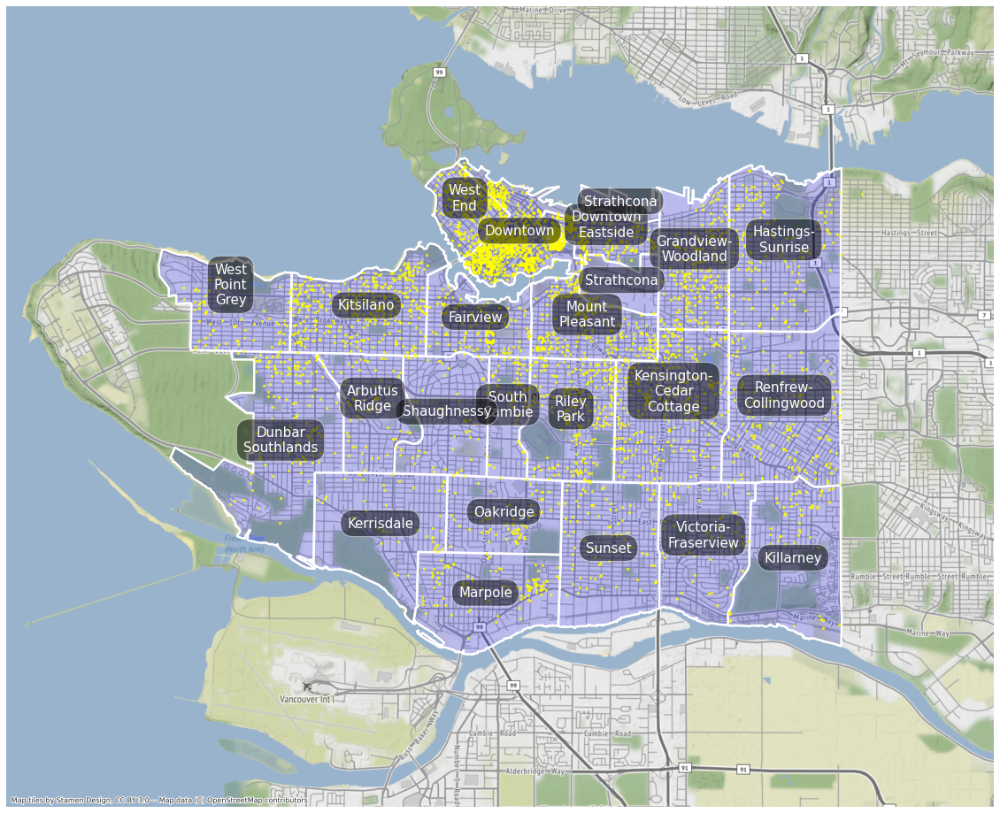

In [302]:
p_mercator = 'EPSG:3857' # Pseudo-Mercator projection, as this is what map services background is in


ax = neighbourhoods.to_crs(p_mercator).plot(figsize=(20,20), color='#0000FF33', linewidth=2.5)
locations.to_crs(p_mercator).plot(color='yellow', markersize=5, ax=ax,alpha=0.7)

lims = np.array(neighbourhoods.to_crs(p_mercator).total_bounds) # xmin, ymin, xmax, ymax
margin = 5000
lims = lims + np.array([-margin, -margin, margin, margin])
ax.set_xlim(lims[0], lims[2])
ax.set_ylim(lims[1], lims[3])
# Grab the BG tile
ctx.add_basemap(ax)
# Turn off seaborn theme lines and axes
plt.axis('off');

# Add neighbourhood names:
# See https://stackoverflow.com/questions/38899190/geopandas-label-polygons
# 1) Get points within each neighbourhood (tuples of xy's)
label_coords = neighbourhoods['geometry'].to_crs(p_mercator).apply(lambda x: x.centroid.coords[0])
# 2) Plot them
for i, nbh in neighbourhoods['neighbourhood'].iteritems():
   # Add \n for better text placement
   nbh = nbh.replace(' ', '\n').replace('-', '-\n')
   plt.text(x=label_coords.iloc[i][0], y=label_coords.iloc[i][1] , s=nbh,
            horizontalalignment='center', color='white', size=15,
            bbox=dict(facecolor='black', alpha=0.5, boxstyle="Round, pad=0.5, rounding_size=1"))
    

In [90]:
#with plt.style.context('default'):
#    pd.plotting.scatter_matrix(df, alpha=0.3)

In [91]:
#sns.pairplot(data=df)

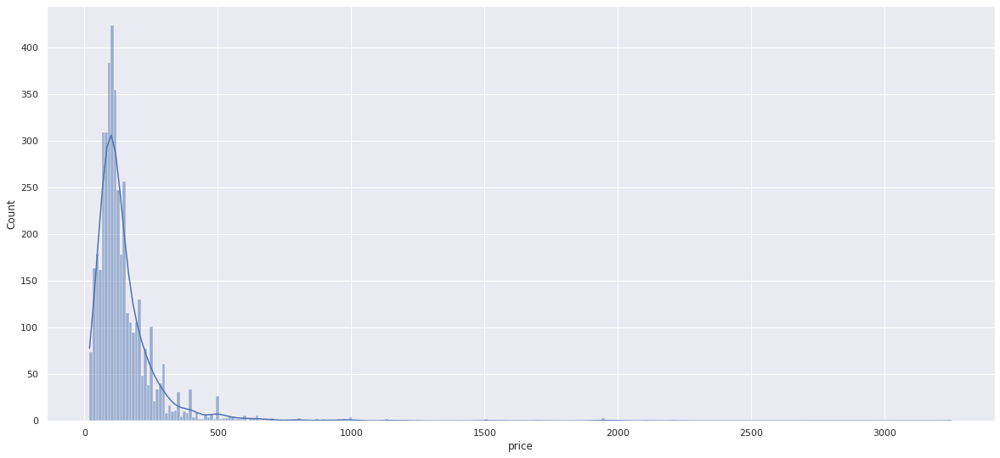

In [92]:
fig, ax = plt.subplots(figsize=(20,9));
sns.histplot(data=df, x='price', ax=ax, kde=True);

In [93]:
df.groupby(by='neighbourhood')['price'].median().sort_values().index

Index(['Oakridge', 'Renfrew-Collingwood', 'Victoria-Fraserview', 'Killarney',
       'Marpole', 'Sunset', 'Hastings-Sunrise', 'Kensington-Cedar Cottage',
       'Shaughnessy', 'Riley Park', 'Arbutus Ridge', 'Kerrisdale', 'Fairview',
       'South Cambie', 'West End', 'Grandview-Woodland', 'Dunbar Southlands',
       'Mount Pleasant', 'West Point Grey', 'Downtown Eastside', 'Downtown',
       'Strathcona', 'Kitsilano'],
      dtype='object', name='neighbourhood')

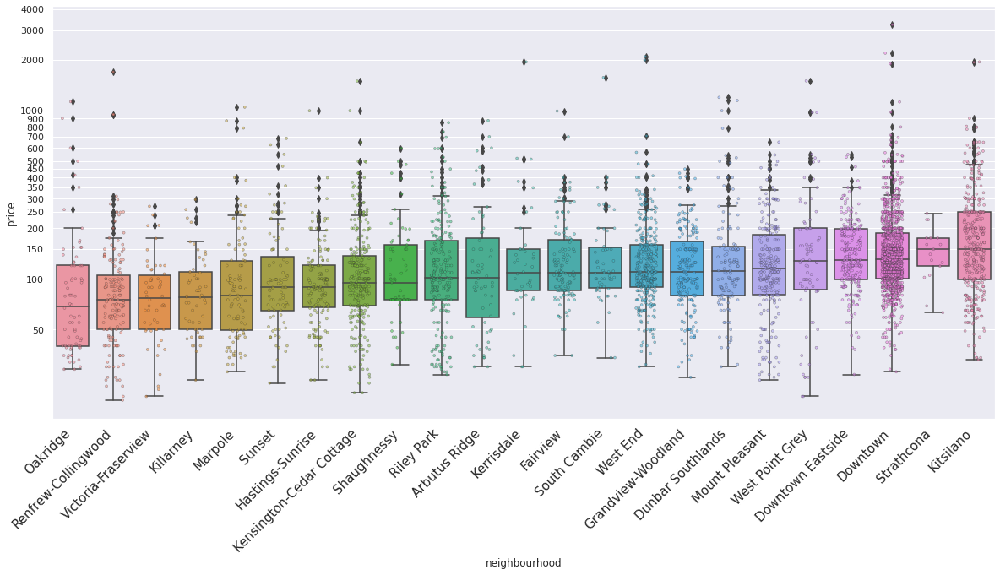

In [94]:
fig, ax = plt.subplots(figsize=(20,9))
# Plotting by median price value
order = df.groupby(by='neighbourhood')['price'].median().sort_values().index
sns.stripplot(data=df, x='neighbourhood', y='price', order=order, ax=ax, s=3, alpha=.5, jitter=0.25, edgecolor='#333333', linewidth=.5);
sns.boxplot(data=df, x='neighbourhood', y='price', order=order, ax=ax);
plt.xticks(rotation=45, ha='right', size=15);
plt.yscale('log')
y_ticks = list(chain(range(50,500,50), range(500, 1000, 100), range(1000, 5000, 1000)))
plt.yticks(ticks=y_ticks, labels=y_ticks);


In [95]:
df['room_type'].value_counts()

Entire home/apt    3359
Private room        915
Shared room          21
Hotel room            4
Name: room_type, dtype: int64

Consistently low ratings get [removed](https://www.airbnb.ca/help/article/2159/how-does-my-experiences-rating-or-reviews-affect-my-ability-to-host#:~:text=Guests%20like%20to%20know%20they,and%2For%20removed%20from%20Airbnb.) from AirBnB, probably explaining the lack of places with lots of reviews but reviewed at a low score.

<AxesSubplot:xlabel='review_scores_rating', ylabel='Count'>

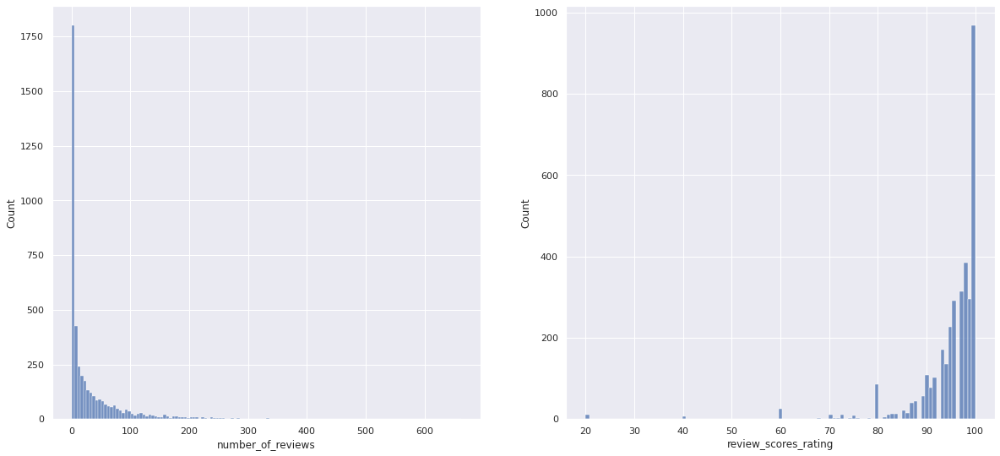

In [96]:
fig, axes = plt.subplots(1, 2, figsize=(20,9))
sns.histplot(data=df, x='number_of_reviews', ax=axes[0])
sns.histplot(data=df, x='review_scores_rating', ax=axes[1])

<AxesSubplot:xlabel='number_of_reviews', ylabel='review_scores_rating'>

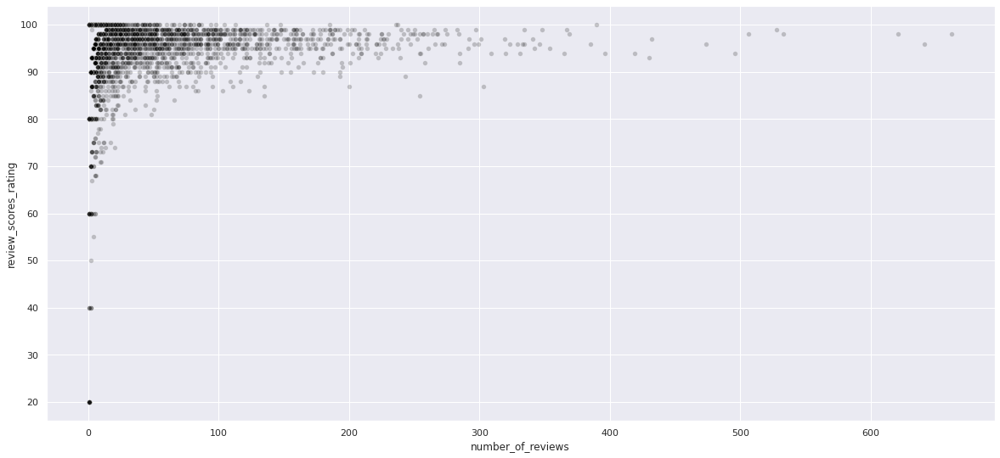

In [97]:
fig, ax = plt.subplots(figsize=(20,9))
sns.scatterplot(data=df, x='number_of_reviews', y='review_scores_rating', s=30, alpha=0.2, color='black', ax=ax)

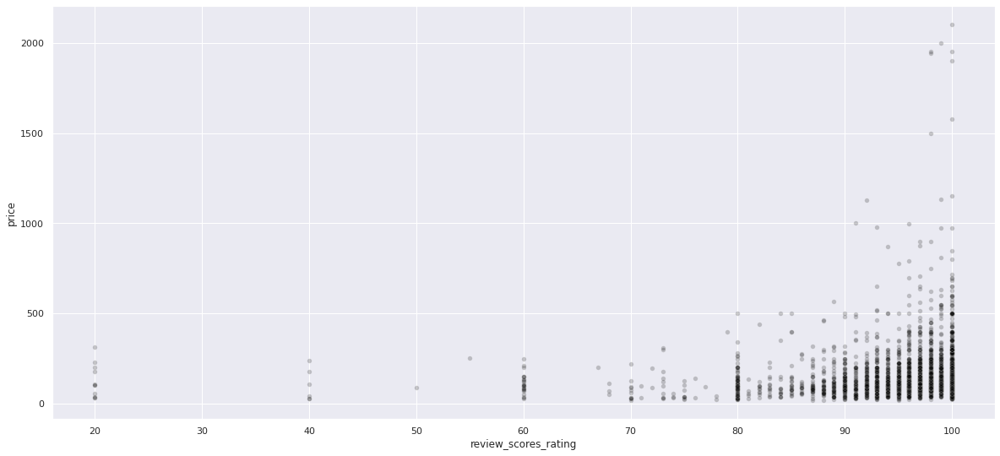

In [98]:
fig, ax = plt.subplots(figsize=(20,9))
sns.scatterplot(data=df, x='review_scores_rating', y='price', s=30, alpha=0.2, color='black', ax=ax);

In [99]:
df['price'].corr(df['review_scores_rating'])

0.09799890047217624

Perhaps hosts are setting price first, and customers based on overall...

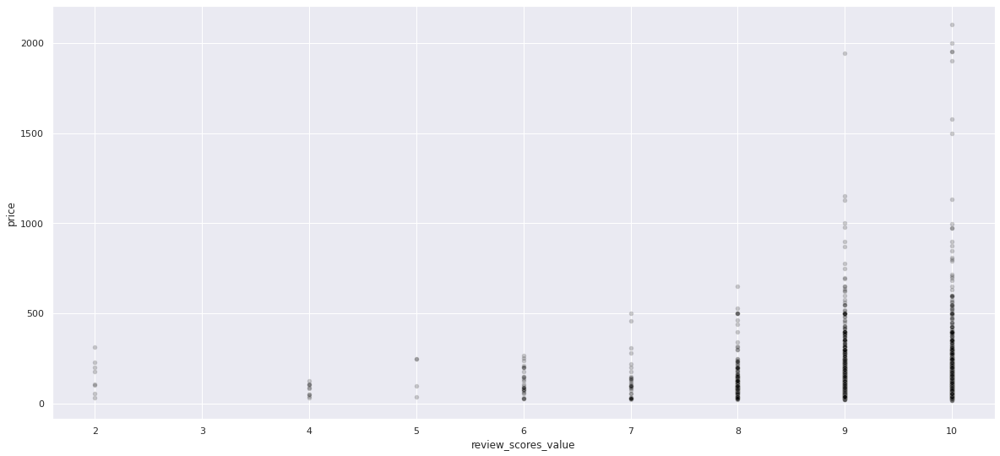

In [100]:
fig, ax = plt.subplots(figsize=(20,9))
sns.scatterplot(data=df, x='review_scores_value', y='price', s=30, alpha=0.2, color='black', ax=ax);

In [101]:
df['price'].corr(df['review_scores_value'])

0.024795547491765452

In [102]:
# Host since histogram

In [103]:
# Bed vs bathroom

In [104]:
# Review framing

# Building a Linear Model

In [75]:
## Predicting for price
# Drop columns that aren't useful
df_price = df.drop(labels=['id', 'latitude', 'longitude', 'host_id'], axis=1).copy()

In [76]:
# Helper func to get timedeltas
def time_since(old_time, new_time):
    """
    Return a timedelta obj that is new_time - old_time (datetime objs).
    """
    return new_time - old_time

In [77]:
# These datetime columns are dates in the past
df_price.columns[df_price.dtypes == 'datetime64[ns]']

Index(['host_since', 'first_review', 'last_review'], dtype='object')

In [78]:
# Convert datetime columns 'host_since', 'first_review', and 'last_review' to days until when the data was scraped
DATE_SCRAPED = pd.to_datetime('2021-04-15', format='%Y-%m-%d')
col_apply_inplace(df_price, ['host_since', 'first_review', 'last_review'], time_since, new_time=DATE_SCRAPED)

In [79]:
df_price.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4299 entries, 0 to 4298
Data columns (total 69 columns):
 #   Column                              Non-Null Count  Dtype          
---  ------                              --------------  -----          
 0   neighbourhood                       4299 non-null   object         
 1   price                               4299 non-null   int64          
 2   minimum_nights                      4299 non-null   int64          
 3   availability_365                    4299 non-null   int64          
 4   calculated_host_listings_count      4299 non-null   int64          
 5   host_since                          4170 non-null   timedelta64[ns]
 6   host_response_time                  2991 non-null   object         
 7   host_response_rate                  2991 non-null   float64        
 8   host_acceptance_rate                3099 non-null   float64        
 9   host_is_superhost                   4170 non-null   float64        
 10  host_has_pro

In [80]:
# These are the quantitative variables where NA's have to be filled.
df_price.columns[df_price.isna().sum()>0]

Index(['host_since', 'host_response_time', 'host_response_rate',
       'host_acceptance_rate', 'host_is_superhost', 'host_has_profile_pic',
       'host_identity_verified', 'bathrooms_text', 'bedrooms', 'beds',
       'first_review', 'last_review', 'reviews_per_month',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value'],
      dtype='object')

For reviews, the median or mean makes sense.

For first_review or last_review, and reviews_per_month, NA's basically mean there's no reviews, so 0 makes sense.



<AxesSubplot:ylabel='Frequency'>

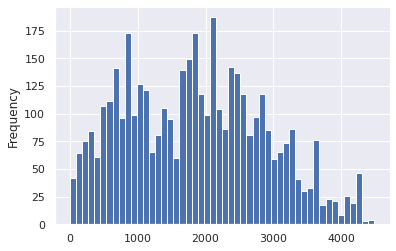

In [81]:
df_price['host_since'].dt.days.plot.hist(bins=50)

<AxesSubplot:>

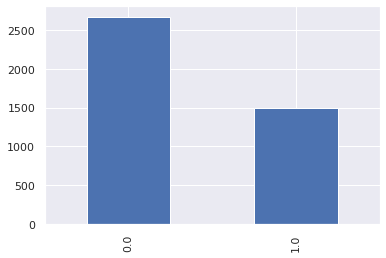

In [82]:
df_price['host_is_superhost'].value_counts().plot.bar()

In [83]:
type(df_price['host_since'][0])

pandas._libs.tslibs.timedeltas.Timedelta

In [84]:
df_price[df_price['host_since'].isna()]

,neighbourhood,price,minimum_nights,availability_365,calculated_host_listings_count,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,accommodates,room_type,bathrooms_text,bedrooms,beds,instant_bookable,amenity_wifi,amenity_heating,amenity_smoke alarm,amenity_essentials,amenity_kitchen,amenity_long term stays allowed,amenity_hangers,amenity_washer,amenity_dryer,amenity_hair dryer,amenity_hot water,amenity_iron,amenity_shampoo,amenity_dedicated workspace,amenity_tv,amenity_carbon monoxide alarm,amenity_dishes and silverware,amenity_fire extinguisher,amenity_refrigerator,amenity_cooking basics,amenity_microwave,amenity_coffee maker,amenity_stove,amenity_oven,amenity_free parking on premises,amenity_private entrance,amenity_bed linens,amenity_free street parking,amenity_dishwasher,amenity_first aid kit,amenity_patio or balcony,amenity_extra pillows and blankets,amenity_elevator,amenity_cable tv,amenity_luggage dropoff allowed,amenity_air conditioning,amenity_gym,amenity_backyard,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,reviews_per_month,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
65,Kensington-Cedar Cottage,500,5,0,2,NaT,NaN,NaN,NaN,NaN,NaN,NaN,8,Entire home/apt,2.0,4.0,5.0,0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,29,1,0,3192 days,248 days,0.27,94.0,10.0,9.0,10.0,10.0,9.0,9.0
73,Kensington-Cedar Cottage,77,30,158,2,NaT,NaN,NaN,NaN,NaN,NaN,NaN,1,Entire home/apt,1.0,1.0,1.0,0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,22,0,0,2894 days,397 days,0.23,95.0,10.0,10.0,10.0,10.0,9.0,9.0
129,Kensington-Cedar Cottage,125,4,20,4,NaT,NaN,NaN,NaN,NaN,NaN,NaN,4,Entire home/apt,1.0,1.0,2.0,1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,14,1,0,2802 days,72 days,0.15,96.0,10.0,10.0,10.0,10.0,10.0,10.0
179,Kitsilano,100,30,318,2,NaT,NaN,NaN,NaN,NaN,NaN,NaN,2,Entire home/apt,1.0,1.0,1.0,1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,125,22,1,2531 days,15 days,1.48,95.0,10.0,10.0,10.0,10.0,10.0,9.0
242,Kitsilano,457,7,0,1,NaT,NaN,NaN,NaN,NaN,NaN,NaN,5,Entire home/apt,1.5,3.0,4.0,0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,5,0,0,2480 days,977 days,0.06,88.0,8.0,8.0,10.0,10.0,10.0,7.0
383,Mount Pleasant,110,90,0,3,NaT,NaN,NaN,NaN,NaN,NaN,NaN,4,Entire home/apt,1.0,1.0,2.0,0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,22,0,0,2177 days,970 days,0.30,94.0,9.0,10.0,10.0,10.0,10.0,9.0
407,Downtown,75,180,364,3,NaT,NaN,NaN,NaN,NaN,NaN,NaN,3,Entire home/apt,1.0,NaN,0.0,0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,16,0,0,2116 days,562 days,0.23,90.0,9.0,10.0,9.0,9.0,10.0,8.0
435,Kerrisdale,93,4,296,1,NaT,NaN,NaN,NaN,NaN,NaN,NaN,2,Entire home/apt,1.5,1.0,2.0,0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,120,10,0,2120 days,47 days,1.70,95.0,10.0,10.0,10.0,10.0,9.0,10.0
471,Downtown,199,1,365,2,NaT,NaN,NaN,NaN,NaN,NaN,NaN,2,Private room,1.0,1.0,1.0,0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1

In [85]:
listings[listings['host_since'].isna()]

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
65,498112,https://www.airbnb.com/rooms/498112,20210412154228,2021-04-13,Central Modern House with View and 2 Kitchens,"Centrally located, spacious, contemporary home...",Situated in historic Cedar Cottage and steps t...,https://a0.muscache.com/pictures/84ee1d21-9a55...,2459577,https://www.airbnb.com/users/show/2459577,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,"Vancouver, British Columbia, Canada",Kensington-Cedar Cottage,NaN,49.25099,-123.07457,Entire house,Entire home/apt,8,NaN,2 baths,4.0,5.0,"[""Iron"", ""Ethernet connection"", ""Dryer"", ""Bed ...",$500.00,5,180,5,5,180,180,5.0,180.0,NaN,t,0,0,0,0,2021-04-13,29,1,0,2012-07-19,2020-08-10,94.0,10.0,9.0,10.0,10.0,9.0,9.0,21-157259,f,2,2,0,0,0.27
73,654763,https://www.airbnb.com/rooms/654763,20210412154228,2021-04-13,1 Bedroom Private Furnished Suite,<b>The space</b><br />Fully furnished newly re...,NaN,https://a0.muscache.com/pictures/62fb7594-c934...,2459577,https://www.airbnb.com/users/show/2459577,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,NaN,Kensington-Cedar Cottage,NaN,49.25060,-123.07175,Entire guest suite,Entire home/apt,1,NaN,1 bath,1.0,1.0,"[""Heating"", ""Kitchen"", ""Dishes and silverware""...",$77.00,30,1125,30,30,1125,1125,30.0,1125.0,NaN,t,13,17,18,158,2021-04-13,22,0,0,2013-05-13,2020-03-14,95.0,10.0,10.0,10.0,10.0,9.0,9.0,NaN,f,2,2,0,0,0.23
129,1361276,https://www.airbnb.com/rooms/1361276,20210412154228,2021-04-13,Private space in heritage home in lovely area,"Our home is close to Commercial Drive, a funky...",Our house is a 5 minute walk to Commercial Dri...,https://a0.muscache.com/pictures/miso/Hosting-...,1743089,https://www.airbnb.com/users/show/1743089,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,"Vancouver, British Columbia, Canada",Kensington-Cedar Cottage,NaN,49.25808,-123.07538,Entire house,Entire home/apt,4,NaN,1 bath,1.0,2.0,"[""Iron"", ""Dryer"", ""Bed linens"", ""Cooking basic...",$125.00,4,29,4,4,29,29,4.0,29.0,NaN,t,10,10,20,20,2021-04-13,14,1,0,2013-08-13,2021-02-02,96.0,10.0,10.0,10.0,10.0,10.0,10.0,21-157024,t,4,4,0,0,0.15
179,2183209,https://www.airbnb.com/rooms/2183209,20210412154228,2021-04-14,Kitsilano PENTHOUSE,30 DAY MINIMUM. Located in the heart of Kitsil...,The apartment is five blocks away from Kitsila...,https://a0.muscache.com/pictures/02ddb4c0-eac8...,11132986,https://www.airbnb.com/users/show/11132986,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,"Vancouver, British Columbia, Canada",Kitsilano,NaN,49.26597,-123.15633,Entire apartment,Entire home/apt,2,NaN,1 bath,1.0,1.0,"[""Extra pillows and blankets"", ""Carbon monoxid...",$100.00,30,1125,30,30,1125,112

In [86]:
df_price.head(1).loc[:,(df_price.dtypes == 'int64' )| (df_price.dtypes == 'float64')]

,price,minimum_nights,availability_365,calculated_host_listings_count,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,accommodates,bathrooms_text,bedrooms,beds,instant_bookable,amenity_wifi,amenity_heating,amenity_smoke alarm,amenity_essentials,amenity_kitchen,amenity_long term stays allowed,amenity_hangers,amenity_washer,amenity_dryer,amenity_hair dryer,amenity_hot water,amenity_iron,amenity_shampoo,amenity_dedicated workspace,amenity_tv,amenity_carbon monoxide alarm,amenity_dishes and silverware,amenity_fire extinguisher,amenity_refrigerator,amenity_cooking basics,amenity_microwave,amenity_coffee maker,amenity_stove,amenity_oven,amenity_free parking on premises,amenity_private entrance,amenity_bed linens,amenity_free street parking,amenity_dishwasher,amenity_first aid kit,amenity_patio or balcony,amenity_extra pillows and blankets,amenity_elevator,amenity_cable tv,amenity_luggage dropoff allowed,amenity_air conditioning,amenity_gym,amenity_backyard,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,reviews_per_month,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
0,150,90,346,40,0.93,0.87,0.0,1.0,1.0,5,2.0,2.0,2.0,0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,16,0,0,0.14,93.0,9.0,9.0,10.0,9.0,10.0,9.0


In [87]:
# These columns are strings that will have to be converted to dummies
dummy_cols = df_price.columns[df_price.dtypes == 'object']
print(dummy_cols)

Index(['neighbourhood', 'host_response_time', 'room_type'], dtype='object')


In [88]:
df_price_dummied = pd.get_dummies(df_price, columns=dummy_cols, prefix=dummy_cols, drop_first=True)

In [89]:
df_price_dummied.head(1)

,price,minimum_nights,availability_365,calculated_host_listings_count,host_since,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,accommodates,bathrooms_text,bedrooms,beds,instant_bookable,amenity_wifi,amenity_heating,amenity_smoke alarm,amenity_essentials,amenity_kitchen,amenity_long term stays allowed,amenity_hangers,amenity_washer,amenity_dryer,amenity_hair dryer,amenity_hot water,amenity_iron,amenity_shampoo,amenity_dedicated workspace,amenity_tv,amenity_carbon monoxide alarm,amenity_dishes and silverware,amenity_fire extinguisher,amenity_refrigerator,amenity_cooking basics,amenity_microwave,amenity_coffee maker,amenity_stove,amenity_oven,amenity_free parking on premises,amenity_private entrance,amenity_bed linens,amenity_free street parking,amenity_dishwasher,amenity_first aid kit,amenity_patio or balcony,amenity_extra pillows and blankets,amenity_elevator,amenity_cable tv,amenity_luggage dropoff allowed,amenity_air conditioning,amenity_gym,amenity_backyard,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,reviews_per_month,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,neighbourhood_Downtown,neighbourhood_Downtown Eastside,neighbourhood_Dunbar Southlands,neighbourhood_Fairview,neighbourhood_Grandview-Woodland,neighbourhood_Hastings-Sunrise,neighbourhood_Kensington-Cedar Cottage,neighbourhood_Kerrisdale,neighbourhood_Killarney,neighbourhood_Kitsilano,neighbourhood_Marpole,neighbourhood_Mount Pleasant,neighbourhood_Oakridge,neighbourhood_Renfrew-Collingwood,neighbourhood_Riley Park,neighbourhood_Shaughnessy,neighbourhood_South Cambie,neighbourhood_Strathcona,neighbourhood_Sunset,neighbourhood_Victoria-Fraserview,neighbourhood_West End,neighbourhood_West Point Grey,host_response_time_within a day,host_response_time_within a few hours,host_response_time_within an hour,room_type_Hotel room,room_type_Private room,room_type_Shared room
0,150,90,346,40,4266 days,0.93,0.87,0.0,1.0,1.0,5,2.0,2.0,2.0,0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,16,0,0,3439 days,1509 days,0.14,93.0,9.0,9.0,10.0,9.0,10.0,9.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


In [90]:
df_price_dummied.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4299 entries, 0 to 4298
Data columns (total 94 columns):
 #   Column                                  Non-Null Count  Dtype          
---  ------                                  --------------  -----          
 0   price                                   4299 non-null   int64          
 1   minimum_nights                          4299 non-null   int64          
 2   availability_365                        4299 non-null   int64          
 3   calculated_host_listings_count          4299 non-null   int64          
 4   host_since                              4170 non-null   timedelta64[ns]
 5   host_response_rate                      2991 non-null   float64        
 6   host_acceptance_rate                    3099 non-null   float64        
 7   host_is_superhost                       4170 non-null   float64        
 8   host_has_profile_pic                    4170 non-null   float64        
 9   host_identity_verified                  4

In [91]:
df_price_dummied_filled = df_price_dummied.fillna(df_price_dummied.median())

In [92]:
df_price_dummied.shape

(4299, 94)

In [93]:
# rename
df_pdf = df_price_dummied_filled.copy()

In [94]:
df_pdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4299 entries, 0 to 4298
Data columns (total 94 columns):
 #   Column                                  Non-Null Count  Dtype          
---  ------                                  --------------  -----          
 0   price                                   4299 non-null   int64          
 1   minimum_nights                          4299 non-null   int64          
 2   availability_365                        4299 non-null   int64          
 3   calculated_host_listings_count          4299 non-null   int64          
 4   host_since                              4299 non-null   timedelta64[ns]
 5   host_response_rate                      4299 non-null   float64        
 6   host_acceptance_rate                    4299 non-null   float64        
 7   host_is_superhost                       4299 non-null   float64        
 8   host_has_profile_pic                    4299 non-null   float64        
 9   host_identity_verified                  4

<AxesSubplot:>

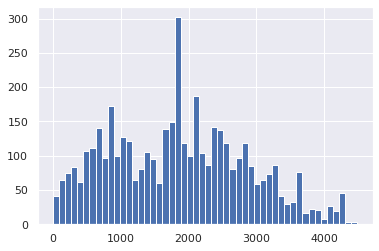

In [95]:
df_pdf['host_since'].dt.days.hist(bins=50)

In [96]:
# Change timedelta to days
cols_td = df_pdf.columns[df_pdf.dtypes == "timedelta64[ns]"]
df_pdf[cols_td] = df_pdf[cols_td].apply(lambda x: x.dt.days)

In [97]:
X = df_pdf.loc[:,~(df_pdf.columns == 'price')]

In [98]:
X.shape

(4299, 93)

In [99]:
y = df['price']

In [100]:
y.shape

(4299,)

In [101]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 7, test_size = 0.3)

In [102]:
lm_model = LinearRegression(normalize=True)

In [103]:
lm_model.fit(X_train, y_train)

LinearRegression(normalize=True)

In [104]:
y_preds = lm_model.predict(X_test)

In [105]:
r_score = r2_score(y_test, y_preds)

In [106]:
print(r_score)

0.4209043072315708


In [107]:
lm_model.get_params()

{'copy_X': True,
 'fit_intercept': True,
 'n_jobs': None,
 'normalize': True,
 'positive': False}

In [108]:
y_test

3770      85
2320      54
1470     300
652      185
2796     250
638      279
325      330
3597      37
3653      88
2348      31
2420      68
1774      40
1962      68
1788      75
1096     300
1758      74
2449      90
194      125
3905      33
513      245
3691      98
3859      55
2462     150
3033     135
4273     132
2966     134
3789      90
2645     496
2084     110
4183      99
540       95
2132     189
578       87
1420      80
2212      70
1558     259
2403      85
658      159
2799     157
4292      59
1690     190
3479     259
1255      92
3110     119
4089      80
3572     101
2006      42
2123     200
2356     181
1244     169
2959     283
2325     105
3570     275
2644     180
2280     200
718      350
511      110
1533     103
3938     309
1402     105
3173      69
2409     185
2074     296
3801     110
362       99
687       31
2584     120
887      125
2742      79
378      424
533      105
1511     150
48       110
1440     139
3402     188
1619     107
3023      97

In [109]:
y_test_reset = y_test.reset_index(drop=True)

In [110]:
results = pd.concat([pd.Series(y_preds), y_test_reset, y_preds - y_test_reset, (y_preds - y_test_reset)/y_test_reset], axis=1)
print(results)

               0  price        price     price
0      86.332198     85     1.332198  0.015673
1     115.248121     54    61.248121  1.134224
2     270.552914    300   -29.447086 -0.098157
3     168.827910    185   -16.172090 -0.087417
4     160.507479    250   -89.492521 -0.357970
5     215.355092    279   -63.644908 -0.228118
6     327.908156    330    -2.091844 -0.006339
7      72.577814     37    35.577814  0.961563
8     116.969339     88    28.969339  0.329197
9     -56.367943     31   -87.367943 -2.818321
10     42.881501     68   -25.118499 -0.369390
11      6.013365     40   -33.986635 -0.849666
12     71.004133     68     3.004133  0.044178
13     58.025204     75   -16.974796 -0.226331
14    258.437463    300   -41.562537 -0.138542
15    143.423623     74    69.423623  0.938157
16    141.158657     90    51.158657  0.568430
17    142.243880    125    17.243880  0.137951
18    137.691998     33   104.691998  3.172485
19    141.808452    245  -103.191548 -0.421190
20    215.109

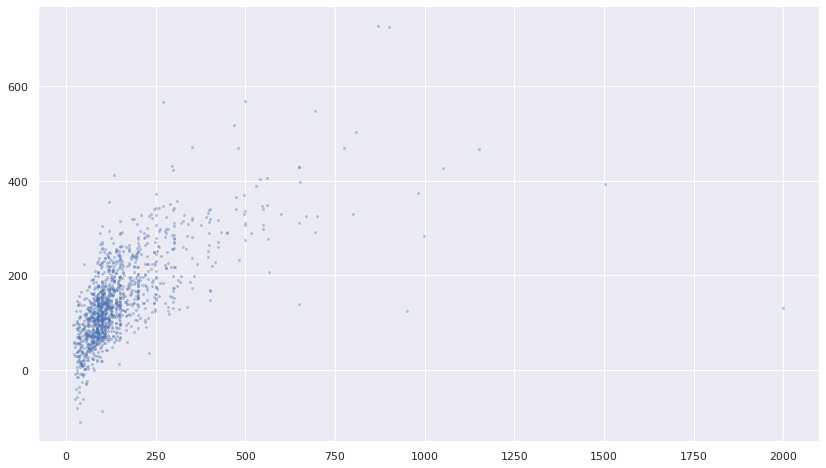

In [111]:
plt.figure(figsize=(14,8))
plt.scatter(y_test_reset, y_preds, s=4, alpha=0.3);


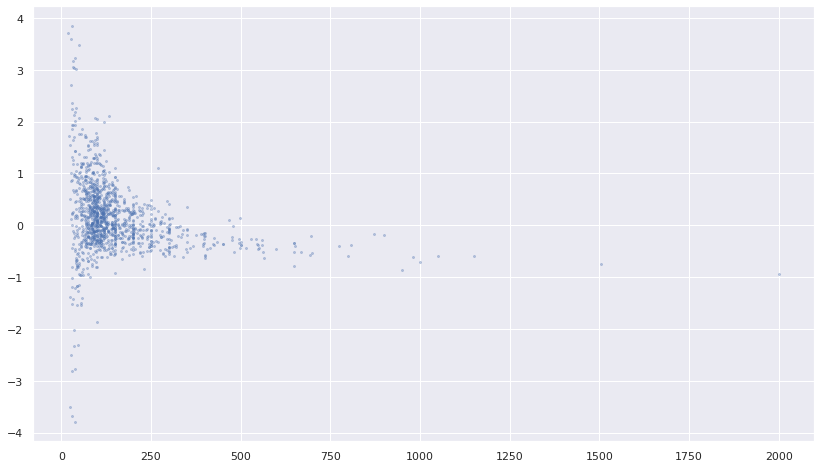

In [112]:
plt.figure(figsize=(14,8))
plt.scatter(y_test_reset, (y_preds - y_test_reset)/y_test_reset, s=4, alpha=0.3);

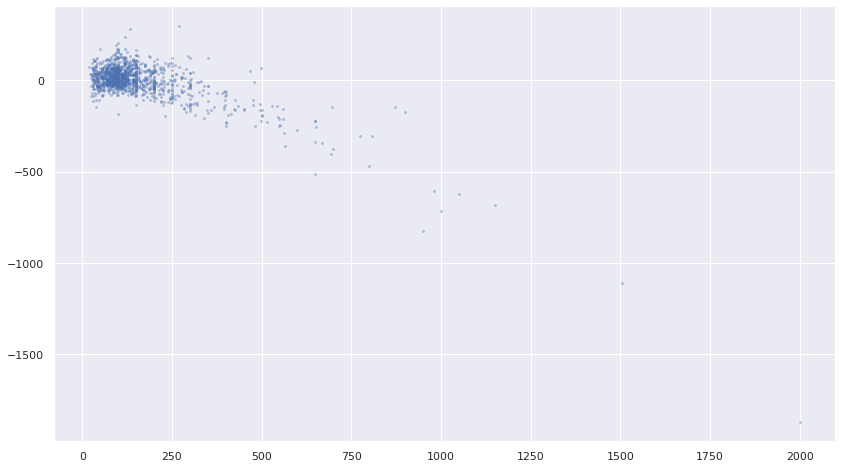

In [113]:
plt.figure(figsize=(14,8))
plt.scatter(y_test_reset, y_preds - y_test_reset, s=4, alpha=0.3);

In [114]:
coefs = pd.concat([X.columns.to_series().reset_index(drop=True), pd.Series(lm_model.coef_)], axis=1)
coefs.columns = ['feature', 'coef']
print(coefs)

                                   feature       coef
0                           minimum_nights   0.011563
1                         availability_365   0.056283
2           calculated_host_listings_count  -0.746261
3                               host_since  -0.000623
4                       host_response_rate  35.394141
5                     host_acceptance_rate  11.857039
6                        host_is_superhost  -4.468382
7                     host_has_profile_pic  27.161404
8                   host_identity_verified  -3.941618
9                             accommodates  13.657067
10                          bathrooms_text  57.323241
11                                bedrooms  23.684213
12                                    beds  -0.874419
13                        instant_bookable   5.293021
14                            amenity_wifi -81.656313
15                         amenity_heating  14.428727
16                     amenity_smoke alarm  22.830381
17                      amen

In [115]:
coefs.sort_values(by='coef')

,feature,coef
90,room_type_Hotel room,-95.802314
14,amenity_wifi,-81.656313
73,neighbourhood_Killarney,-67.679007
84,neighbourhood_Victoria-Fraserview,-56.883685
92,room_type_Shared room,-52.535565
17,amenity_essentials,-45.365171
70,neighbourhood_Hastings-Sunrise,-45.154474
75,neighbourhood_Marpole,-36.424792
83,neighbourhood_Sunset,-35.246469
69,neighbourhood_Grandview-Woodland,-34.554964


In [116]:
for i, col in enumerate(X.columns):
    print(X.columns[i] + " " + str(np.round(lm_model.coef_[i], decimals=3)))

minimum_nights 0.012
availability_365 0.056
calculated_host_listings_count -0.746
host_since -0.001
host_response_rate 35.394
host_acceptance_rate 11.857
host_is_superhost -4.468
host_has_profile_pic 27.161
host_identity_verified -3.942
accommodates 13.657
bathrooms_text 57.323
bedrooms 23.684
beds -0.874
instant_bookable 5.293
amenity_wifi -81.656
amenity_heating 14.429
amenity_smoke alarm 22.83
amenity_essentials -45.365
amenity_kitchen -0.364
amenity_long term stays allowed -12.155
amenity_hangers 14.349
amenity_washer -9.722
amenity_dryer 7.561
amenity_hair dryer -4.86
amenity_hot water 0.323
amenity_iron -7.437
amenity_shampoo 30.633
amenity_dedicated workspace -11.246
amenity_tv 1.733
amenity_carbon monoxide alarm -10.296
amenity_dishes and silverware -11.321
amenity_fire extinguisher 4.044
amenity_refrigerator 4.47
amenity_cooking basics -1.993
amenity_microwave -12.893
amenity_coffee maker 6.363
amenity_stove -2.28
amenity_oven -1.234
amenity_free parking on premises 1.554
amen

# Predicting rating


In [117]:
df_pdf.columns

Index(['price', 'minimum_nights', 'availability_365',
       'calculated_host_listings_count', 'host_since', 'host_response_rate',
       'host_acceptance_rate', 'host_is_superhost', 'host_has_profile_pic',
       'host_identity_verified', 'accommodates', 'bathrooms_text', 'bedrooms',
       'beds', 'instant_bookable', 'amenity_wifi', 'amenity_heating',
       'amenity_smoke alarm', 'amenity_essentials', 'amenity_kitchen',
       'amenity_long term stays allowed', 'amenity_hangers', 'amenity_washer',
       'amenity_dryer', 'amenity_hair dryer', 'amenity_hot water',
       'amenity_iron', 'amenity_shampoo', 'amenity_dedicated workspace',
       'amenity_tv', 'amenity_carbon monoxide alarm',
       'amenity_dishes and silverware', 'amenity_fire extinguisher',
       'amenity_refrigerator', 'amenity_cooking basics', 'amenity_microwave',
       'amenity_coffee maker', 'amenity_stove', 'amenity_oven',
       'amenity_free parking on premises', 'amenity_private entrance',
       'amenity_be

In [118]:
df_review = df_pdf.drop(labels=['number_of_reviews',
       'number_of_reviews_ltm', 'number_of_reviews_l30d', 'first_review',
       'last_review', 'reviews_per_month',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value'], axis=1).copy()

In [119]:
y2 = df_review['review_scores_rating']
X2 = df_review.drop(labels=['review_scores_rating'], axis=1)

In [120]:
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, random_state=7, test_size=0.3)

In [121]:
lm_model2 = LinearRegression(normalize=True)

In [122]:
lm_model2.fit(X2_train, y2_train)

LinearRegression(normalize=True)

In [123]:
y2_preds = lm_model2.predict(X2_test)

In [124]:
r_score = r2_score(y2_test, y2_preds)
print(r_score)

0.09643978129731323


In [125]:
y2_test_reset = y2_test.reset_index(drop=True)
results2 = pd.concat([pd.Series(y2_preds), y2_test_reset, y2_preds - y2_test_reset, (y2_preds - y2_test_reset)/y2_test_reset], axis=1)
print(results2)

               0  review_scores_rating  review_scores_rating  \
0      98.224642                 100.0             -1.775358   
1      97.983088                  92.0              5.983088   
2      95.982699                  97.0             -1.017301   
3      94.460360                  93.0              1.460360   
4      93.672712                  97.0             -3.327288   
5      99.177345                  97.0              2.177345   
6      94.937770                  99.0             -4.062230   
7      94.443967                  97.0             -2.556033   
8      97.358338                  97.0              0.358338   
9      94.384106                  70.0             24.384106   
10     97.986641                  98.0             -0.013359   
11     96.285079                  96.0              0.285079   
12     92.885915                  94.0             -1.114085   
13     92.171540                  88.0              4.171540   
14     93.796572                  93.0  

(0.0, 120.0)

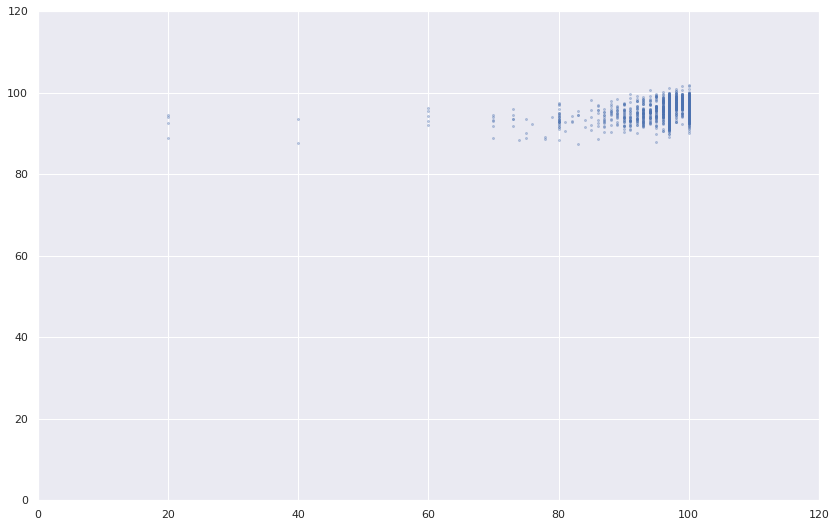

In [126]:
plt.figure(figsize=(14,9))
plt.scatter(y2_test_reset, y2_preds,  s=4, alpha=0.3)
plt.xlim(0,120)
plt.ylim(0,120)

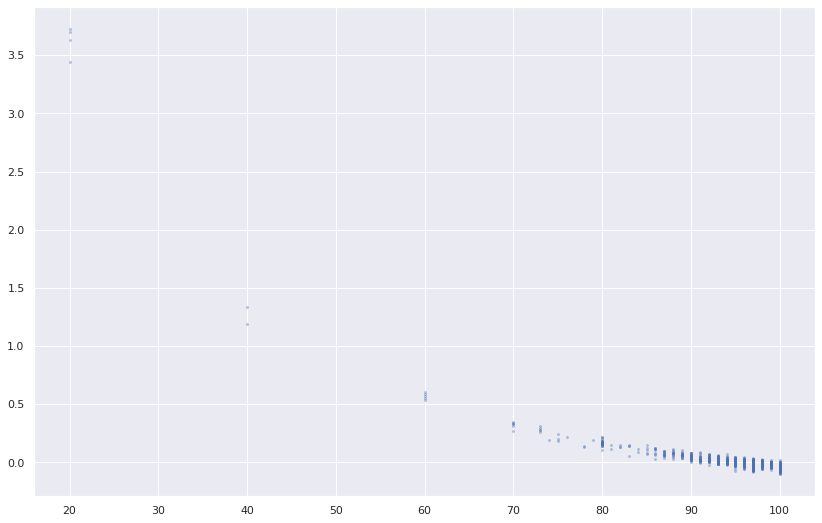

In [127]:
plt.figure(figsize=(14,9))
plt.scatter(y2_test_reset, (y2_preds - y2_test_reset)/y2_test_reset, s=4, alpha=0.3);

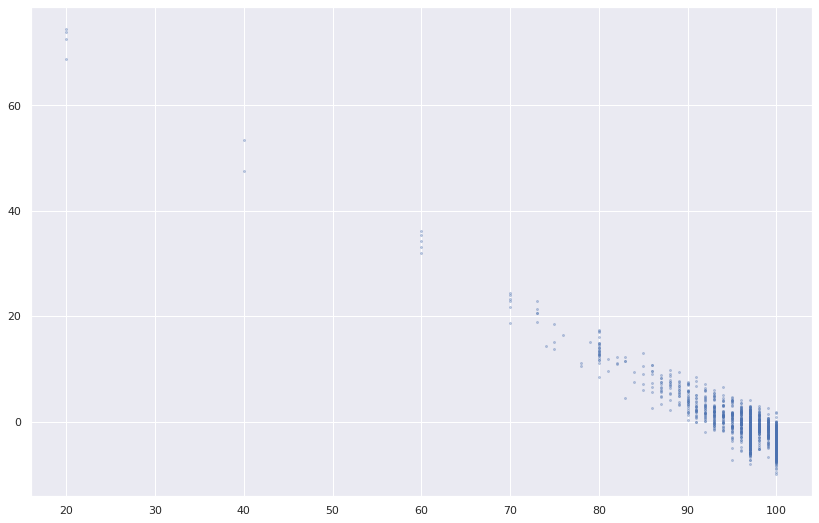

In [128]:
plt.figure(figsize=(14,9))
plt.scatter(y2_test_reset, (y2_preds - y2_test_reset), s=4, alpha=0.3);

In [129]:
coefs2 = pd.concat([X2.columns.to_series().reset_index(drop=True), pd.Series(lm_model2.coef_)], axis=1)
coefs2.columns = ['feature', 'coef']
print(coefs2)

                                   feature       coef
0                                    price   0.002555
1                           minimum_nights   0.010248
2                         availability_365  -0.000648
3           calculated_host_listings_count  -0.031159
4                               host_since   0.000341
5                       host_response_rate   1.503711
6                     host_acceptance_rate  -1.752124
7                        host_is_superhost   2.584772
8                     host_has_profile_pic  -1.105079
9                   host_identity_verified   0.025170
10                            accommodates  -0.127626
11                          bathrooms_text   0.003361
12                                bedrooms   0.242574
13                                    beds  -0.208579
14                        instant_bookable  -0.447266
15                            amenity_wifi  -1.499289
16                         amenity_heating  -0.552804
17                     ameni

In [130]:
coefs2.sort_values(by='coef')

,feature,coef
78,room_type_Hotel room,-22.631525
80,room_type_Shared room,-4.828627
6,host_acceptance_rate,-1.752124
37,amenity_stove,-1.606007
15,amenity_wifi,-1.499289
18,amenity_essentials,-1.260786
8,host_has_profile_pic,-1.105079
20,amenity_long term stays allowed,-0.724191
75,host_response_time_within a day,-0.705376
33,amenity_refrigerator,-0.621791


check what happens when drop extremes for r2 scores

# Predicting binarily

In [131]:
df_pdf['price'].describe()

count    4299.000000
mean      151.511980
std       152.606141
min        19.000000
25%        83.000000
50%       115.000000
75%       175.000000
max      3250.000000
Name: price, dtype: float64

In [132]:
df_pdf_bi = df_pdf.copy()

In [133]:
df_pdf_bi['premium'] = (df_pdf['price'] > 115).astype(int)

In [134]:
df_pdf_bi.head()

,price,minimum_nights,availability_365,calculated_host_listings_count,host_since,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,accommodates,bathrooms_text,bedrooms,beds,instant_bookable,amenity_wifi,amenity_heating,amenity_smoke alarm,amenity_essentials,amenity_kitchen,amenity_long term stays allowed,amenity_hangers,amenity_washer,amenity_dryer,amenity_hair dryer,amenity_hot water,amenity_iron,amenity_shampoo,amenity_dedicated workspace,amenity_tv,amenity_carbon monoxide alarm,amenity_dishes and silverware,amenity_fire extinguisher,amenity_refrigerator,amenity_cooking basics,amenity_microwave,amenity_coffee maker,amenity_stove,amenity_oven,amenity_free parking on premises,amenity_private entrance,amenity_bed linens,amenity_free street parking,amenity_dishwasher,amenity_first aid kit,amenity_patio or balcony,amenity_extra pillows and blankets,amenity_elevator,amenity_cable tv,amenity_luggage dropoff allowed,amenity_air conditioning,amenity_gym,amenity_backyard,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,reviews_per_month,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,neighbourhood_Downtown,neighbourhood_Downtown Eastside,neighbourhood_Dunbar Southlands,neighbourhood_Fairview,neighbourhood_Grandview-Woodland,neighbourhood_Hastings-Sunrise,neighbourhood_Kensington-Cedar Cottage,neighbourhood_Kerrisdale,neighbourhood_Killarney,neighbourhood_Kitsilano,neighbourhood_Marpole,neighbourhood_Mount Pleasant,neighbourhood_Oakridge,neighbourhood_Renfrew-Collingwood,neighbourhood_Riley Park,neighbourhood_Shaughnessy,neighbourhood_South Cambie,neighbourhood_Strathcona,neighbourhood_Sunset,neighbourhood_Victoria-Fraserview,neighbourhood_West End,neighbourhood_West Point Grey,host_response_time_within a day,host_response_time_within a few hours,host_response_time_within an hour,room_type_Hotel room,room_type_Private room,room_type_Shared room,premium
0,150,90,346,40,4266,0.93,0.87,0.0,1.0,1.0,5,2.0,2.0,2.0,0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,16,0,0,3439,1509,0.14,93.0,9.0,9.0,10.0,9.0,10.0,9.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
1,85,30,98,1,4177,1.00,0.57,1.0,0.0,1.0,2,1.0,1.0,1.0,0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,430,3,0,3950,104,3.27,93.0,9.0,10.0,9.0,10.0,10.0,9.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0
2,145,30,203,1,4176,1.00,0.78,1.0,1.0,1.0,2,1.0,1.0,1.0,0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,88,4,0,3605,166,0.73,98.0,10.0,10.0,10.0,10.0,10.0,10.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
3,140,3,123,1,4164,1.00,0.95,0.0,1.0,1.0,4,1.0,1.0,2.0,1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,33,0,0,3847,433,0.26,95.0,10.0,9.0,10.0,9.0,10.0,9.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1
4,195,3,289,1,4139,1.00,0.95,0.0,1.0,1.0,4,1.0,2.0,3.0,1,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,5,0,0,985,605,0.15,96.0,10.0,10.0,10.0,10.0,10.0,9.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [135]:
X3 = df_pdf_bi.drop(labels=['premium'], axis=1)
y3 = df_pdf_bi['premium']

In [136]:
X3_train, X3_test, y3_train, y3_test = train_test_split(X3, y3, random_state=7, test_size=0.3)
lm_model3 = LinearRegression(normalize=True)
lm_model3.fit(X3_train, y3_train)
y3_preds = lm_model3.predict(X3_test)
r_score3 = r2_score(y3_test, y3_preds)
print(r_score3)

0.4162456566599936


In [137]:
fpr, tpr, thresholds = roc_curve(y3_test, y3_preds)
roc_auc = auc(fpr, tpr)
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)

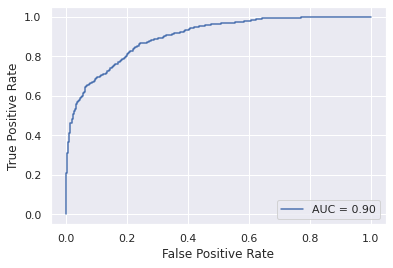

In [138]:
display.plot()
plt.show()

In [139]:
thresholds

array([ 3.04145177,  2.04145177,  0.87417161,  0.87240552,  0.83996639,
        0.83849563,  0.80272414,  0.80079513,  0.78832406,  0.78799708,
        0.78638577,  0.78637694,  0.76720869,  0.76720655,  0.73818532,
        0.73809867,  0.72945283,  0.72922446,  0.70511379,  0.70142364,
        0.70116024,  0.69896104,  0.69392518,  0.69174692,  0.68674949,
        0.68640098,  0.68079565,  0.67828475,  0.67212414,  0.67099702,
        0.66567495,  0.66438984,  0.66242383,  0.66059358,  0.65782995,
        0.65750044,  0.65548525,  0.65513262,  0.64828435,  0.64806859,
        0.64457292,  0.6427566 ,  0.6420525 ,  0.64170568,  0.64138774,
        0.64063719,  0.63915212,  0.6391085 ,  0.63861374,  0.63780556,
        0.63100716,  0.63000289,  0.62829259,  0.6271705 ,  0.62686529,
        0.62604072,  0.62452808,  0.62441629,  0.62422128,  0.62401909,
        0.61809623,  0.61737483,  0.61673097,  0.6146183 ,  0.6134912 ,
        0.61330065,  0.60608929,  0.60571599,  0.60475694,  0.60

In [140]:
spearmanr(y3_test, y3_preds)

SpearmanrResult(correlation=0.6880028798751906, pvalue=1.479928529882612e-181)

In [141]:
pearsonr(y3_test, y3_preds)

(0.6464644677419265, 1.5363979024809428e-153)

<AxesSubplot:xlabel='premium'>

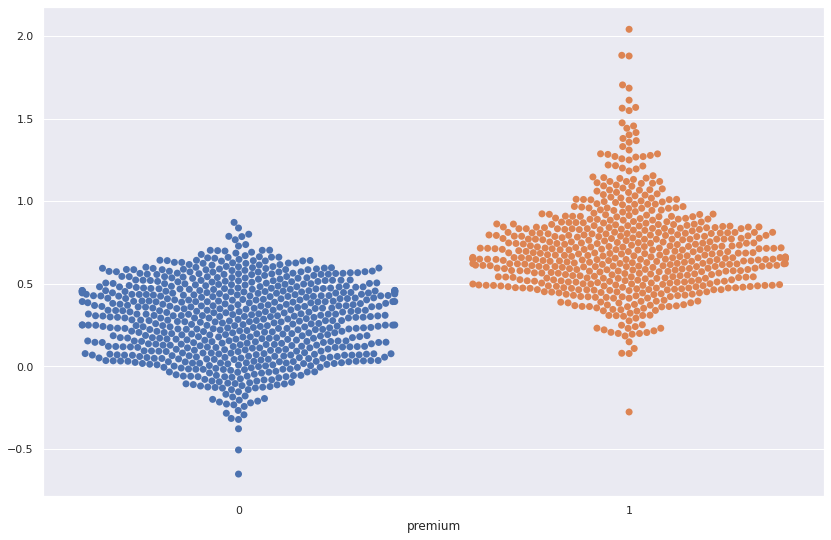

In [142]:
plt.figure(figsize=(14,9))
sns.swarmplot(x=y3_test, y=y3_preds, s=7)

Capping predictions between 0 and 1?!??!

# Model after withdrawing some params

e.g. remove hotel because it's only 4

# Conclusions and Discussion

model across time and cities